# Google Drive

This first code block attaches your google drive and makes a folder structure. You only need to run this when a new VM is assigned to you. To get your code as a single python file go through the following menus File->'Download .py'.

This also downloads 2 npz files for your use: labels.npz and images.npz. For those not using colab you can download manually here:

https://drive.google.com/open?id=1jIKQLhTHZUE6m2mE5lRKMSqN7ZGK2Gyu

https://drive.google.com/open?id=1Gth_AVG5t-4ZhH_whOaXwe0PBXNhIIK0


In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
import os
from google.colab import drive

# Mount google drive
DRIVE_MOUNT='/content/gdrive'
drive.mount(DRIVE_MOUNT)


# create folder to write data to
CIS680_FOLDER=os.path.join(DRIVE_MOUNT, 'My Drive', 'CIS680_2019')
HOMEWORK_FOLDER=os.path.join(CIS680_FOLDER, 'HW2')
os.makedirs(HOMEWORK_FOLDER, exist_ok=True)

# bootstrap environment into place
from google.colab import auth
auth.authenticate_user()

from googleapiclient.discovery import build
drive_service = build('drive', 'v3')

import io
import os
from googleapiclient.http import MediaIoBaseDownload

def download_file(fn, file_id):
    request = drive_service.files().get_media(fileId=file_id)
    downloaded = io.BytesIO()
    downloader = MediaIoBaseDownload(downloaded, request)
    done = False
    while done is False:
        # _ is a placeholder for a progress object that we ignore.
        # (Our file is small, so we skip reporting progress.)
        _, done = downloader.next_chunk()
    
    downloaded.seek(0)

    folder = fn.split('/')
    if len(folder) > 1:
        os.makedirs(folder[0], exist_ok=True)

    with open(fn, 'wb') as f:
        f.write(downloaded.read())

id_to_fn = {
    '1Gth_AVG5t-4ZhH_whOaXwe0PBXNhIIK0': 'labels.npz',
    '1jIKQLhTHZUE6m2mE5lRKMSqN7ZGK2Gyu': 'images.npz'
           }

# download all files into the vm
for fid, fn in id_to_fn.items():
    download_file(fn, fid)

Mounted at /content/gdrive


# PyTorch Dataset

Here you will implement a simple pytorch dataset that loads the images and labels as describe in the PDF.

In [0]:
import numpy as np 
import matplotlib.pyplot as plt
from PIL import Image


image_npz = np.load("images.npz", allow_pickle=True, encoding='latin1')
label_npz = np.load("labels.npz", allow_pickle=True, encoding='latin1')
image_npz = image_npz.f.arr_0
label_npz = label_npz.f.arr_0
print(len(label_npz))
# for i in label_npz:
#   print(i)

9999


In [0]:
# torch and torchvision imports
import torch
import torchvision


class HW2Dataset(torch.utils.data.Dataset):
  def __init__(self,grid_size,num_class, images, labels):
#     self.path = path
    self.grid_shape = grid_size
    self.no_class = num_class
    self.images = images
    self.labels = labels
  def get_gridtensor(self,lab_arr):
      grid_out = torch.zeros((8,8,8))
      for l in lab_arr:
        x_grid_center , y_grid_center = (l[1]+ l[3])/2 , (l[2]+ l[4])/2
        x_patch_center , y_patch_center = int(x_grid_center/16) , int(y_grid_center/16)
        width , height = abs(l[1]-l[3]) , abs(l[2]-l[4])
        x_cell , y_cell = (x_patch_center*16)  , (y_patch_center*16)
        off_x , off_y = x_grid_center- x_cell , y_grid_center - y_cell
        label = torch.zeros(8)
        label[int(5+l[0])] = 1 ## creating a one hot encoded 
        label[0]=1 # setting objectness to 1
        label[1] = off_x/16
        label[2] = off_y/16
        label[3] = width/128
        label[4] = height/128
        grid_out[y_patch_center][x_patch_center] = label
      return grid_out

    
  def __len__(self):
      print(len(self.labels))
      return len(self.labels)
    
  def __getitem__(self, index):
#     image_tensor = self.to_tensor(self.images[idx])
    image_tensor = self.images[index]
    label_tensor = self.get_gridtensor(self.labels[index])
    return (torch.from_numpy(image_tensor) , label_tensor)
    


# Dataset test

We suggest coming up with a test for your dataset. This is laid out in bullet point 2 under section 6. Testing and confirming that all of this works as expected here will save you headache later.

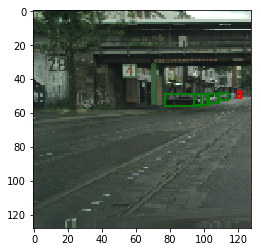

In [0]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
# import opencv2 as cv2
colors = {0:'red',1:'blue',2:'green'}

## get the tensor image 
dataset = HW2Dataset(grid_size=16,num_class=3,images=image_npz,labels=label_npz)
# bbox = label_npz[0]
# labels=dataset.get_gridtensor(bbox)
# labels= labels.transpose(0,1)
# ## show image
# plt.imshow(image_npz[0])
# plt.show()
# # ax = plt.gca()

# fig,ax = plt.subplots(1)
# ax.imshow(image_npz[0])


# # plotting 1 
# for i in range(bbox.shape[0]):
#     box = bbox[i]
#     rect = patches.Rectangle((box[1],box[2]),box[3]-box[1],box[4]-box[2],linewidth=2,edgecolor = colors[box[0]],facecolor='none')
#     ax.add_patch(rect)

plt.show()
img = image_npz[0]
bbox = label_npz[0]
def plot1(img, bbox):
  fig,ax = plt.subplots(1)
  ax.imshow(image_npz[0])
  for i in range(bbox.shape[0]):
    box = bbox[i]
    rect = patches.Rectangle((box[1],box[2]),box[3]-box[1],box[4]-box[2],linewidth=2,edgecolor = colors[box[0]],facecolor='none')
    ax.add_patch(rect)
    
  plt.show()
  
plot1(img,bbox)

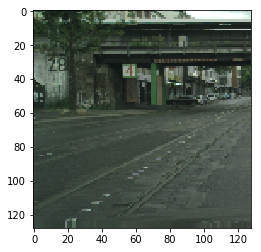

Channel 0


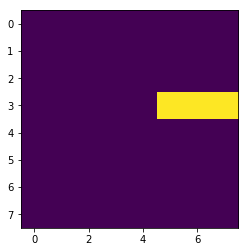

Channel 1


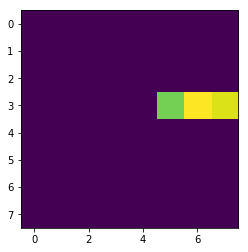

Channel 2


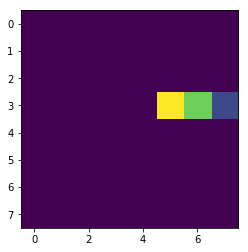

Channel 3


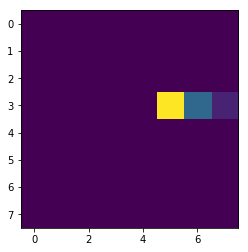

Channel 4


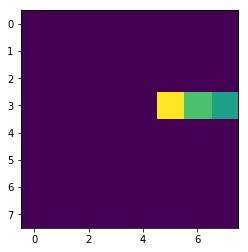

Channel 5


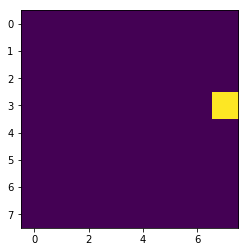

Channel 6


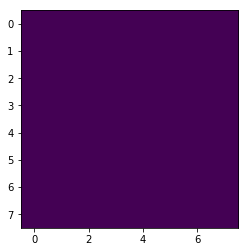

Channel 7


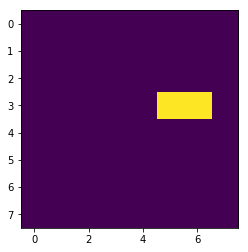

In [0]:
## get the tensor image 
dataset= HW2Dataset(grid_size=16,num_class=3,images=image_npz,labels=label_npz)
bbox = label_npz[0]
labels=dataset.get_gridtensor(bbox)
# labels= labels.transpose(0,1)

## show image
plt.imshow(image_npz[0])
plt.show()
# ax = plt.gca()

# fig,ax = plt.subplots(1)
# ax.imshow(image_npz[0])

## plotting 2 
for i in range(labels.shape[0]):
    print("Channel", i)
    plt.imshow(labels[:,:,i])
    plt.show()


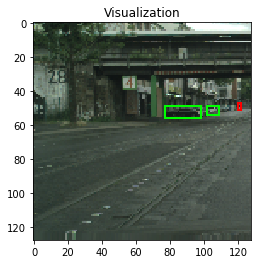

In [0]:
## 

def plot3(img, label,title):
  colors = {0:'red',1:'blue',2:'lime'}
  fig,ax= plt.subplots(1)
  ax.imshow(img)
  for i in range(8):
    for j in range(8):
      clss=-1
      max_prob,max_cls = torch.max(label[i,j,5:],dim=0)
      
      x = (j+ label[i,j,1].item())*16 - (label[i,j,3].item()* 128) /2  
      y = (i+ label[i,j,2].item())*16 - (label[i,j,4].item() *128) /2
      w = label[i,j,3].item()*128
      h = label[i,j,4].item()*128
      rect = patches.Rectangle((x,y),w,h,linewidth=2,edgecolor = colors[max_cls.item()],facecolor='none')
      ax.add_patch(rect)
  plt.title(title)
  plt.show()
  
idx = 0
bbox = label_npz[idx]
labels=dataset.get_gridtensor(bbox)
# labels= labels.transpose(0,1)
img = image_npz[idx]
plot3(img,labels,"Visualization")


In [0]:
## creating dataset 
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.autograd import Variable
import torchvision.transforms.functional as T
from torchvision import transforms
from sklearn.model_selection import train_test_split
import torch.utils.data as data_utils
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

batch_Size= 50

train_size = int(0.8 * label_npz.shape[0])
test_size = label_npz.shape[0] - train_size
print(train_size,test_size)
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_Size,
                                          shuffle=False, num_workers=2)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_Size,
                                          shuffle=False, num_workers=2)


7999 2000
9999


# Model Definition

In [0]:
import numpy as np


class YOLOish(torch.nn.Module):
  def __init__(self):
    super().__init__()
    
    self.conv1= nn.Conv2d(in_channels=3,out_channels= 32,kernel_size=(4,4),stride = 2,padding=1)
    self.bn1 = nn.BatchNorm2d(32)
    self.conv2= nn.Conv2d(in_channels=32,out_channels= 64,kernel_size=(4,4),stride = 2,padding=1)
    self.bn2 = nn.BatchNorm2d(64)
    self.conv3= nn.Conv2d(in_channels=64,out_channels= 128,kernel_size=(4,4),stride = 2,padding=1)
    self.bn3= nn.BatchNorm2d(128)
    self.conv4= nn.Conv2d(in_channels=128,out_channels= 256,kernel_size=(4,4),stride = 2,padding=1)
    self.bn4= nn.BatchNorm2d(256)
    self.conv5= nn.Conv2d(in_channels=256,out_channels= 512,kernel_size=(4,4),stride = 2,padding=1)
    self.bn5= nn.BatchNorm2d(512)
    self.conv6= nn.Conv2d(in_channels=512,out_channels= 1024,kernel_size=(4,4),stride = 2,padding=1)
    self.bn6= nn.BatchNorm2d(1024)
    self.conv7 = nn.ConvTranspose2d(1024, 256, 4, stride=2, padding=1)
    self.bn7= nn.BatchNorm2d(256)
    self.conv8 = nn.ConvTranspose2d(256, 64, 4, stride=2, padding=1)
    self.bn8= nn.BatchNorm2d(64)
    self.conv9= nn.Conv2d(64,8,kernel_size=(3,3),stride = 1,padding=1)
     
  def forward(self, X):
    x = F.relu(self.bn1(self.conv1(X)))
    x = F.relu(self.bn2(self.conv2(x)))
    x = F.relu(self.bn3(self.conv3(x)))
    x = F.relu(self.bn4(self.conv4(x)))
    x = F.relu(self.bn5(self.conv5(x)))
    x = F.relu(self.bn6(self.conv6(x)))
    x = F.relu(self.bn7(self.conv7(x)))
    x = F.relu(self.bn8(self.conv8(x)))
    x = self.conv9(x)
    x = F.sigmoid(x)
    return x 

    
    
    

# Train your network

It might be good to save checkpoints and reload from the most recent. This is due to time constraints inside of colab.

In [0]:
## loss function 
## use this block for only training the yolo model , no mAP
yolo = YOLOish()
yolo.to(device)
yolo = yolo.double()

optimizer = optim.Adam(yolo.parameters(), lr=0.001)

def train_call(pr1,re1,tp_fn1,pr_2,re_2,tp_fn2,pr3,re3,tp_fn3,model1,data):
      
    print(data[0].shape , data[1].shape)
    for j in range(data[0].shape[0]): # should be the batch size
      print()
#       p1,r1,t1,p2,r2,t2,p3,r3,t3=test(model1,data[j])
      pr1.append(p1)
      re1.append(r1)
      tp_fn1.append(t1)
      pr2.append(p2)
      re2.append(r2)
      tp_fn2.append(t2)
      pr3.append(p3)
      re3.append(r3)
      tp_fn3.append(t3)
    return pr1,re1,tp_fn1,pr2,re2,tp_fn2,pr3,re3,tp_fn3

def loss_fn(y_pred,y):
  co_ord =5
  no_obj=0.5
  loc1 = torch.pow(y[:,:,:,1]-y_pred[:,:,:,1],2)
  loc2 = torch.pow(y[:,:,:,2]-y_pred[:,:,:,2],2)
  loc_loss1 = co_ord* torch.sum(y[:,:,:,0]*(loc1+loc2))
  l1 = (torch.sqrt(y[:,:,:,3])-torch.sqrt(y_pred[:,:,:,3]))**2
  l2 = (torch.sqrt(y[:,:,:,4]) -torch.sqrt(y_pred[:,:,:,4]))**2
  loc_loss2 = co_ord* torch.sum(y[:,:,:,0]*(l1+l2))
  loc_loss =  loc_loss1+ loc_loss2
  conf1 = torch.pow((y[:,:,:,0]-y_pred[:,:,:,0]),2)
  conf_loss1 = torch.sum(y[:,:,:,0]* conf1)
  conf2 = 1- y[:,:,:,0]
  conf3 = torch.pow(y[:,:,:,0] - y_pred[:,:,:,0],2)
  conf_loss2 = no_obj* torch.sum(conf2 * conf3)
  conf_loss= conf_loss1 +conf_loss2
  c1 = torch.pow((y[:,:,:,5]) -(y_pred[:,:,:,5]),2)
  c2 = torch.pow((y[:,:,:,6]) -(y_pred[:,:,:,6]),2)
  c3 = torch.pow((y[:,:,:,7]) -(y_pred[:,:,:,7]),2)
  cl_loss= torch.sum(y[:,:,:,0]* (c1+c2+c3))
  
  return loc_loss + conf_loss+ cl_loss
                      
def train(model,optimizer):
# Train your network here and initialize losses 
  correct=0
  total_loss = []
  train_acc=[]
  test_losses =[]
  num_epochs = 20
  test_loss=[]
  test_acc=[]
  for epoch in range(num_epochs):
    print("Epoch %d/%d" % (epoch+1, num_epochs))
    running_loss = 0.0
    pr_total1=[]
    re_total =[]
    pr1=[]
    re1=[]
    tp_fn1 =[]
    pr2=[]
    re2=[]
    tp_fn2 =[]
    pr3=[]
    re3=[]
    tp_fn3 =[]
    model.train()
    for i, data in enumerate(train_loader, 0):
#         print(i)
        inputs, labels = data[0].to(device,dtype= float),data[1].to(device,dtype=float)
        inputs = inputs.transpose(1,3)
        outputs = model(inputs)
#         print(outputs.shape)
        loss = loss_fn(outputs, labels)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        running_loss+=loss.item()
    print(running_loss/(8000))
    total_loss.append(running_loss/(8000))
    

  torch.save(yolo,'hw2_model.pt')
  return total_loss
l= train(yolo,optimizer)
def plot_loss(l):
  y = np.arange(1,101)
  plt.plot(y,l,'black')
  plt.xlabel('epochs')
  plt.ylabel('loss')
  plt.show()
  
## load the model for future use 
model1 = torch.load('hw2_model.pt')
# plot_loss(l)

Epoch 1/20


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1351: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


6.754343706306536
Epoch 2/20
5.341626247188569
Epoch 3/20
4.716703482019935
Epoch 4/20
4.225651264304961
Epoch 5/20
3.7890074310960995
Epoch 6/20
3.319633324161709
Epoch 7/20
2.78911069152959
Epoch 8/20
2.3589178008838907
Epoch 9/20
1.9817002190104178
Epoch 10/20
1.6363811671648414
Epoch 11/20
1.3435698904130449
Epoch 12/20
1.104808938701597
Epoch 13/20
0.9163120796181528
Epoch 14/20
0.782710473877791
Epoch 15/20
0.6814792329648423
Epoch 16/20
0.6161410889845534
Epoch 17/20
0.5752931552282939
Epoch 18/20
0.5219710837423998
Epoch 19/20
0.4827477462972663
Epoch 20/20
0.45353458250976914


/usr/local/lib/python3.6/dist-packages/torch/serialization.py:292: UserWarning: Couldn't retrieve source code for container of type YOLOish. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:292: UserWarning: Couldn't retrieve source code for container of type Conv2d. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:292: UserWarning: Couldn't retrieve source code for container of type BatchNorm2d. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:292: UserWarning: Couldn't retrieve source code for container of type ConvTranspose2d. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [0]:
model1 = torch.load('hw2_model.pt')
# torch.save(model1,"100epochmodel")

720


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1351: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


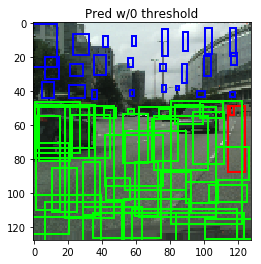

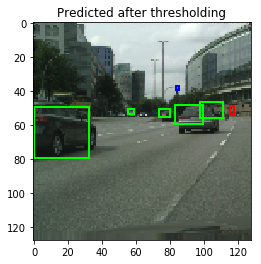

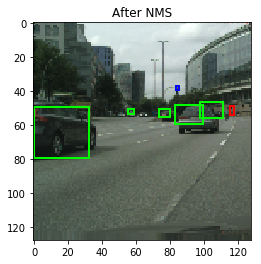

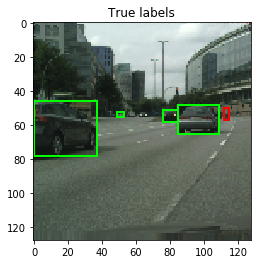

721


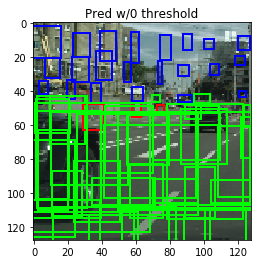

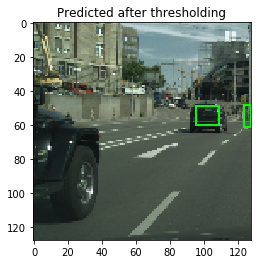

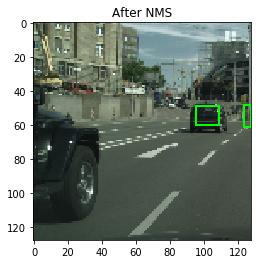

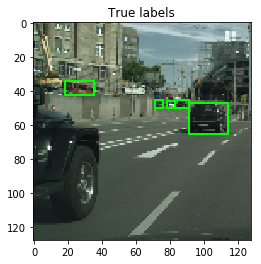

722


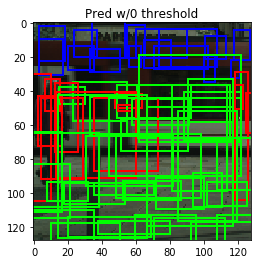

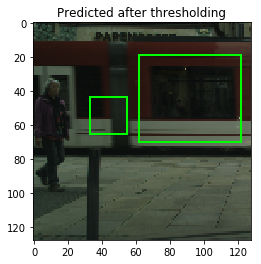

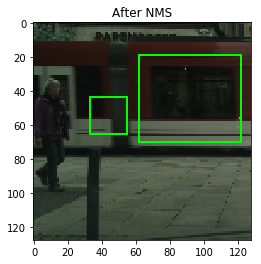

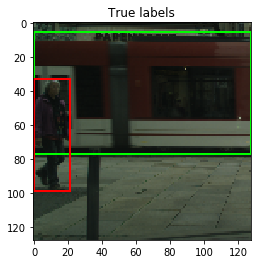

723


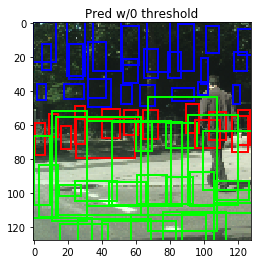

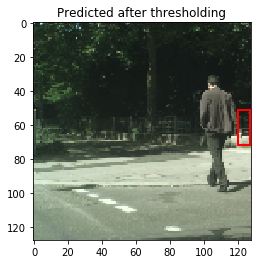

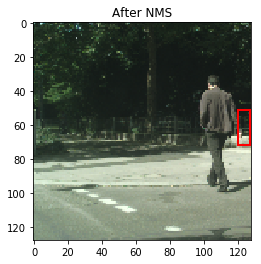

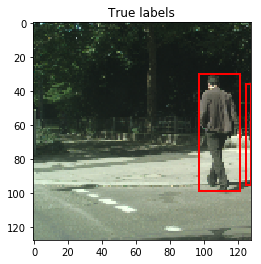

724


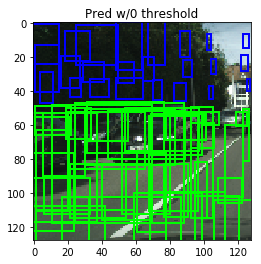

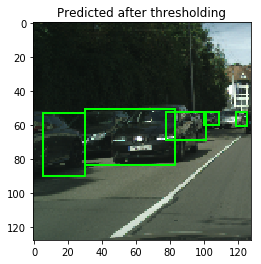

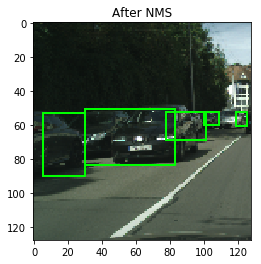

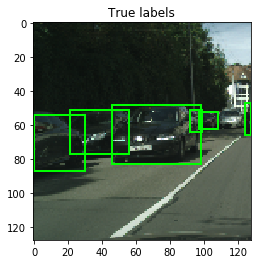

725


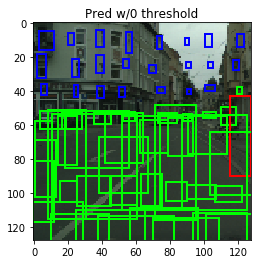

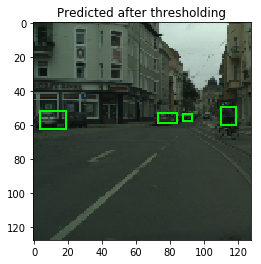

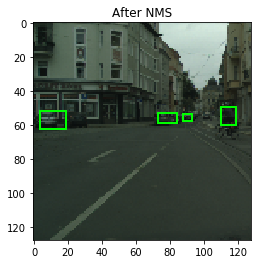

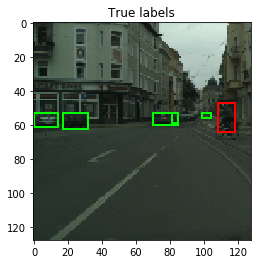

726


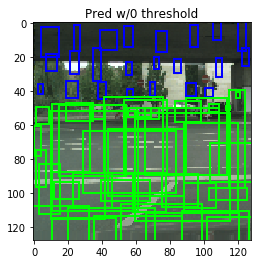

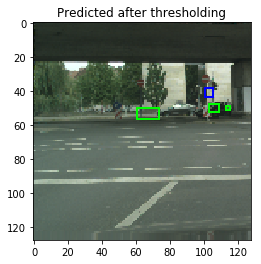

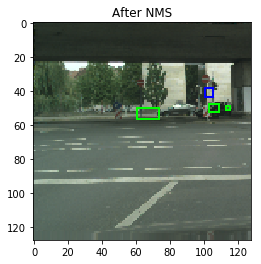

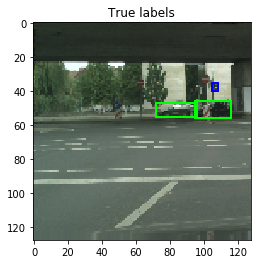

727


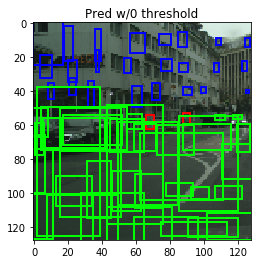

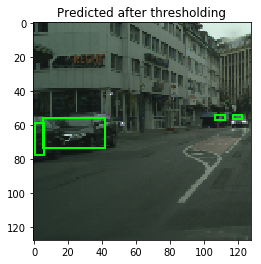

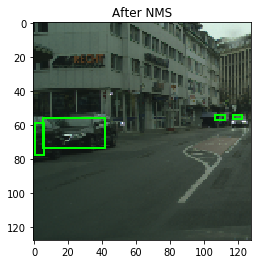

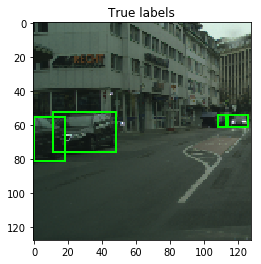

728


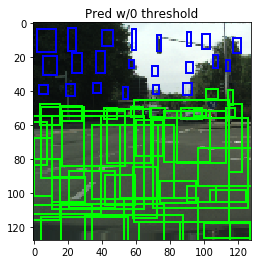

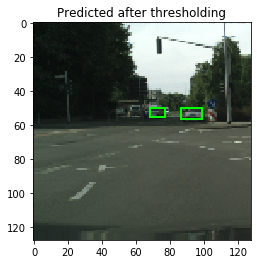

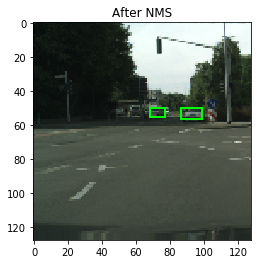

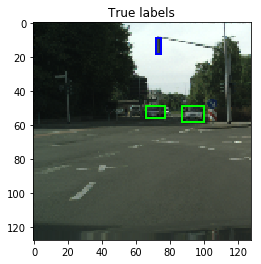

729


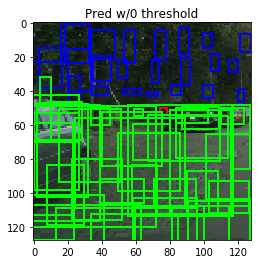

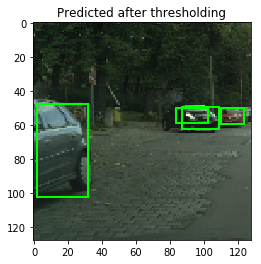

suppresion


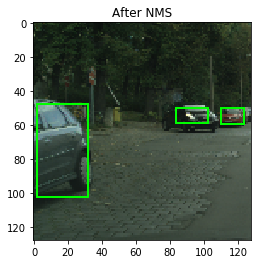

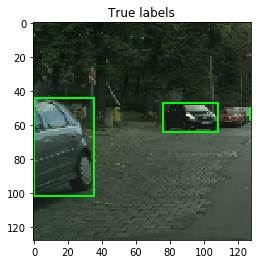

730


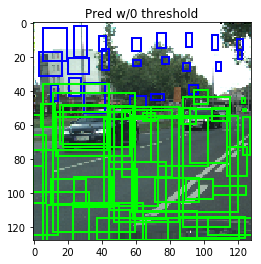

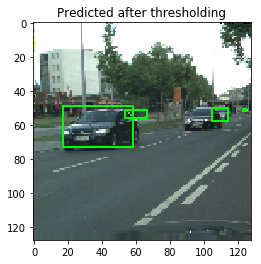

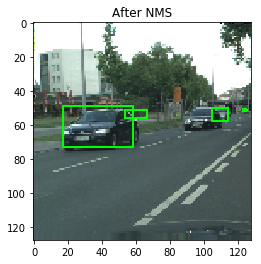

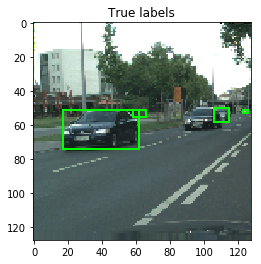

731


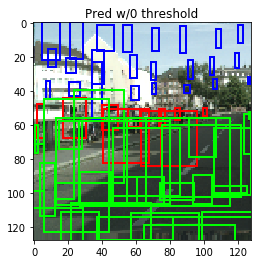

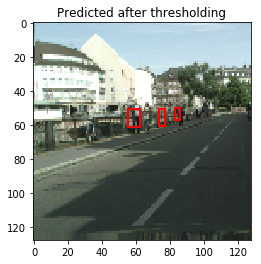

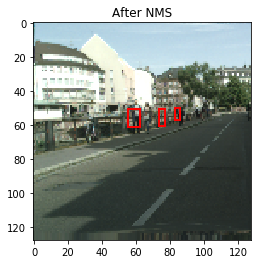

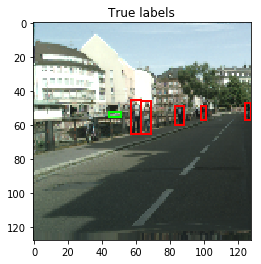

732


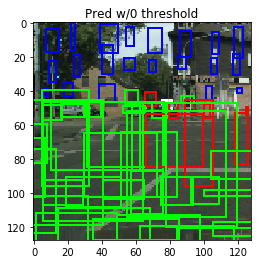

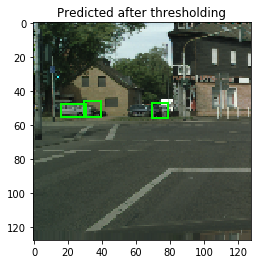

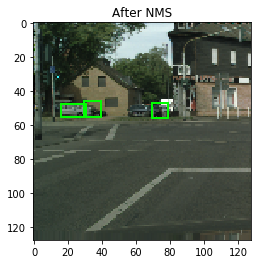

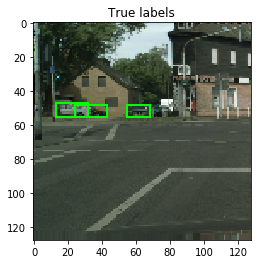

733


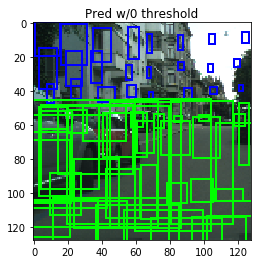

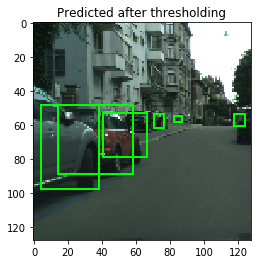

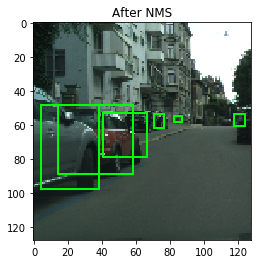

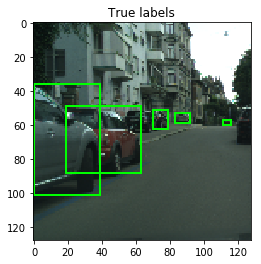

734


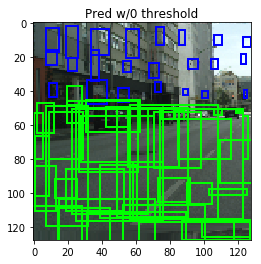

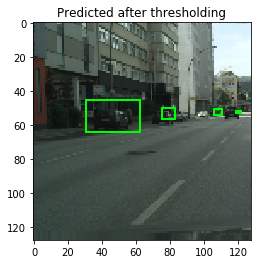

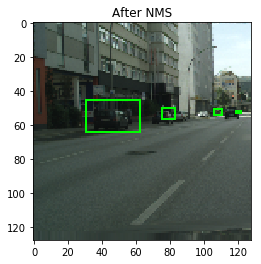

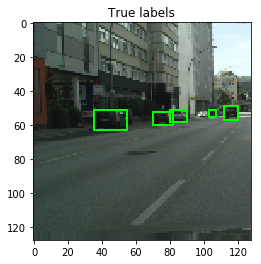

735


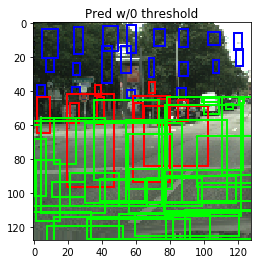

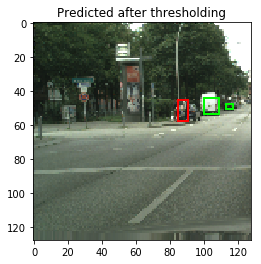

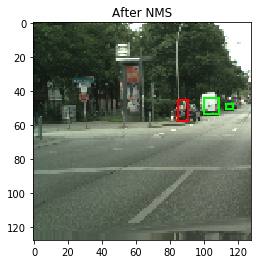

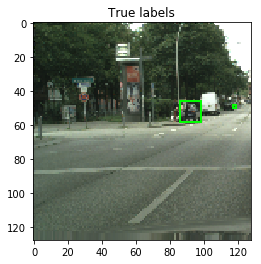

736


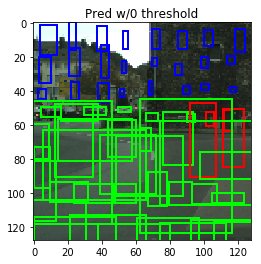

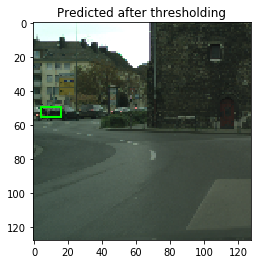

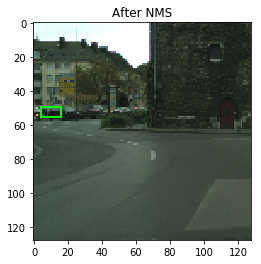

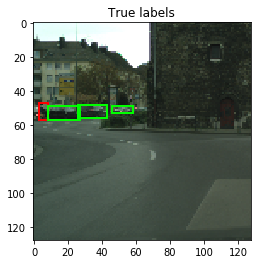

737


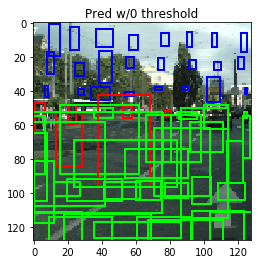

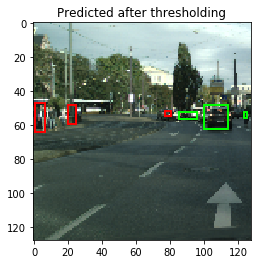

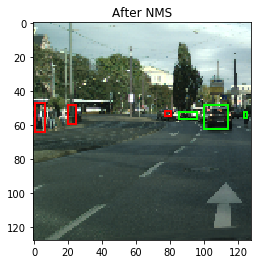

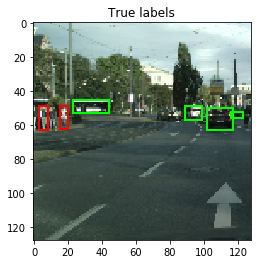

738


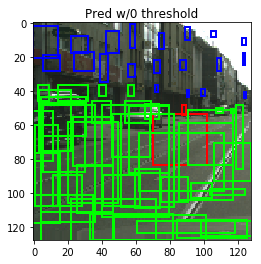

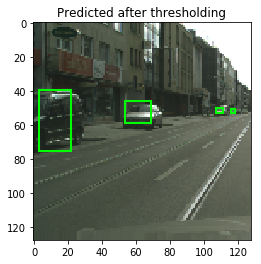

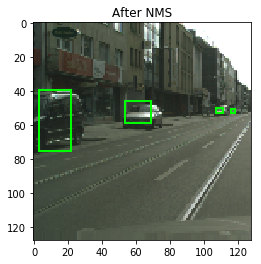

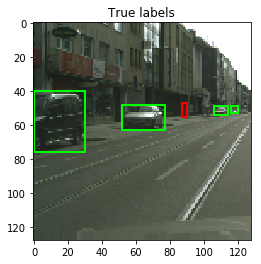

739


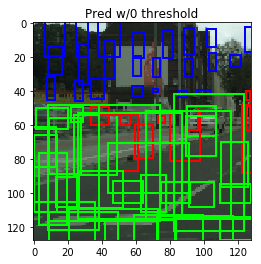

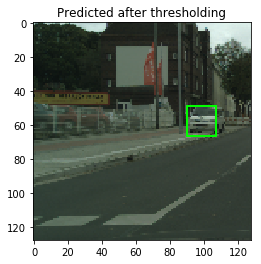

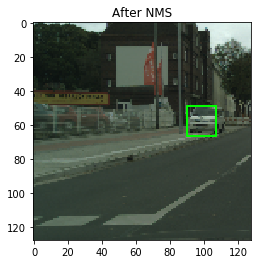

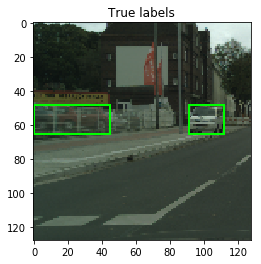

740


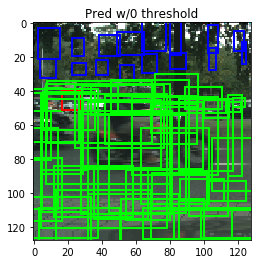

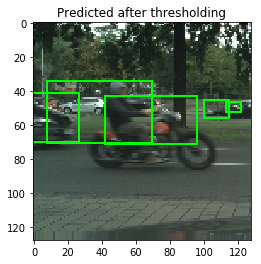

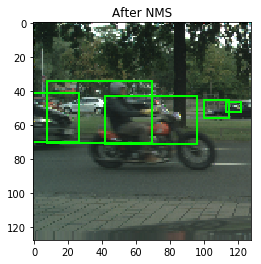

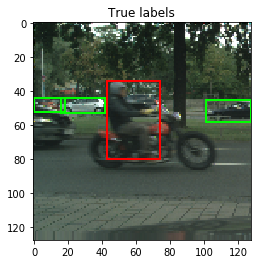

741


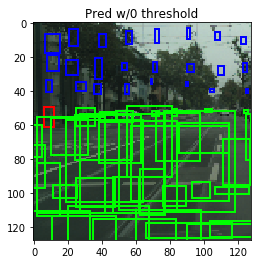

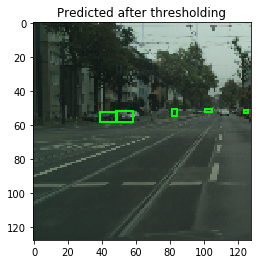

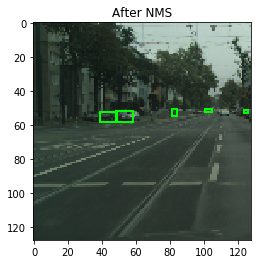

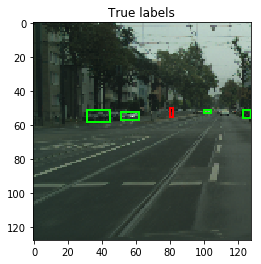

742


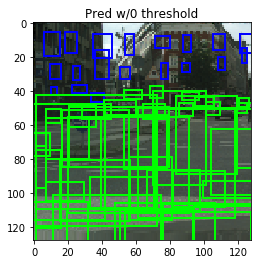

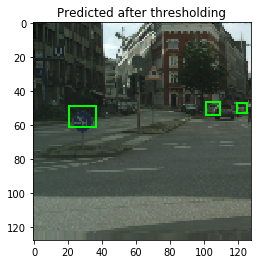

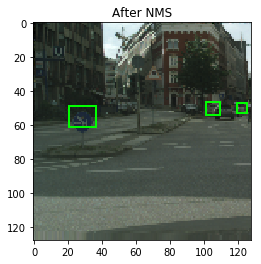

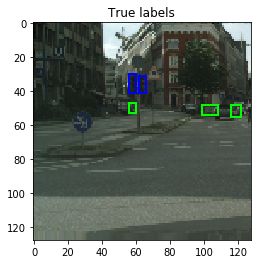

743


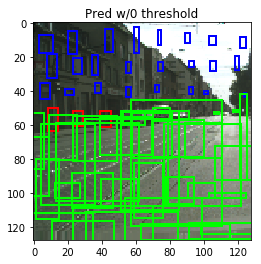

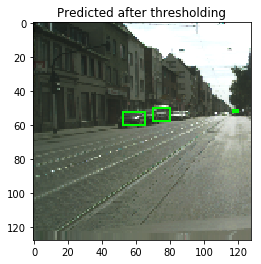

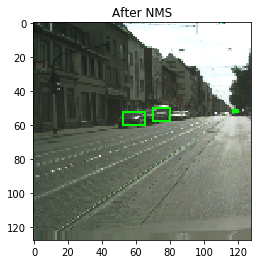

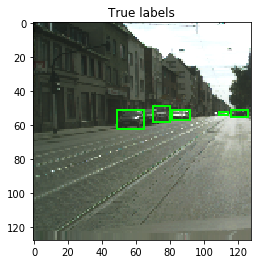

744


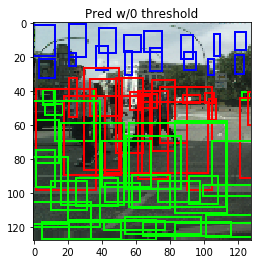

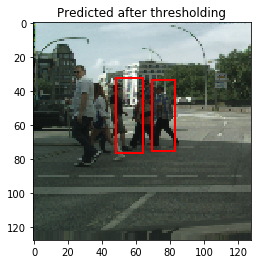

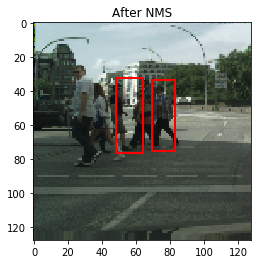

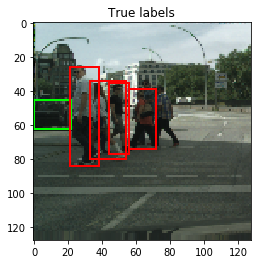

745


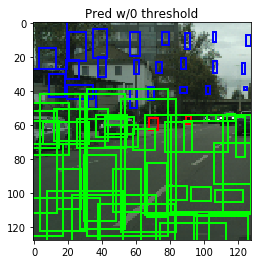

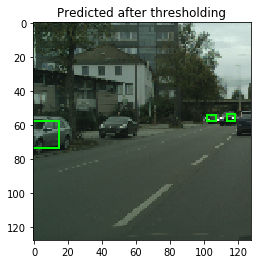

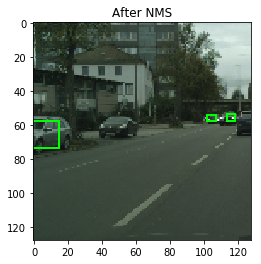

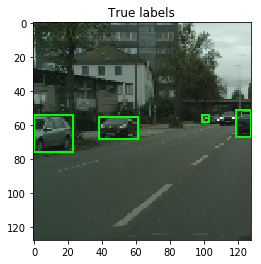

746


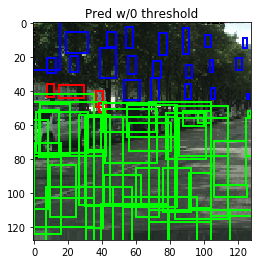

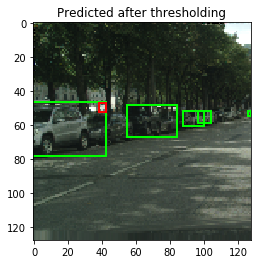

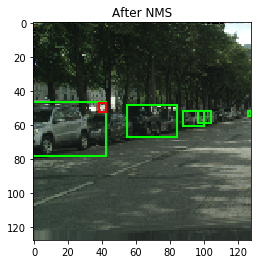

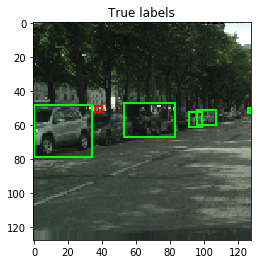

747


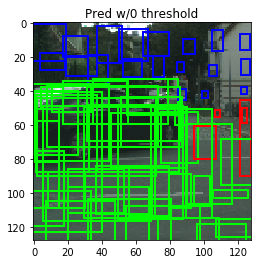

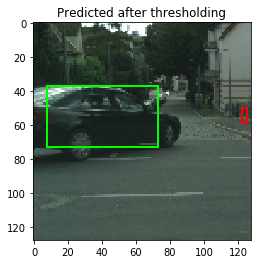

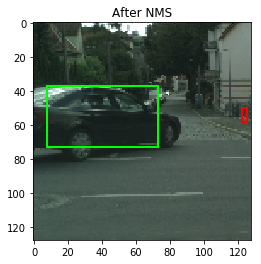

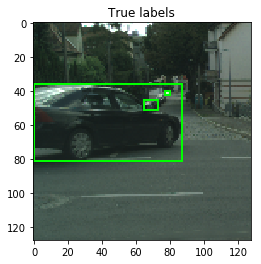

748


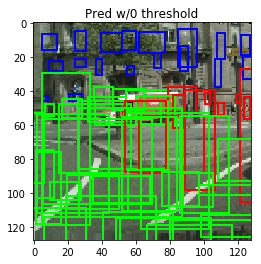

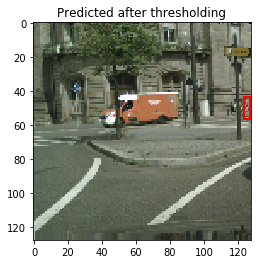

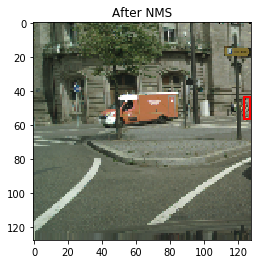

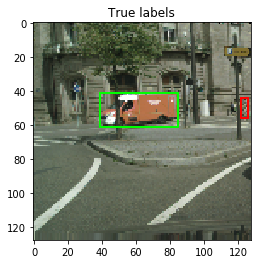

749


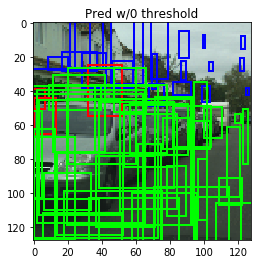

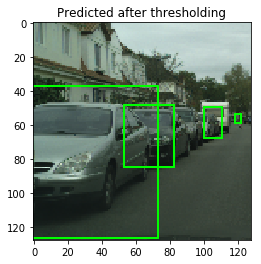

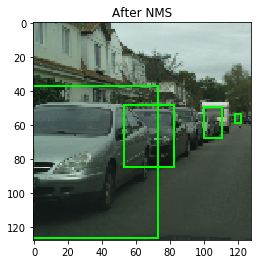

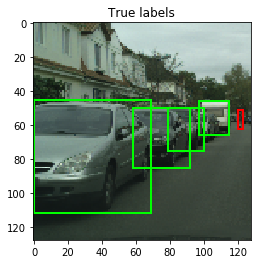

750


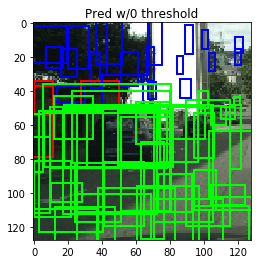

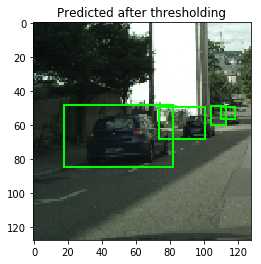

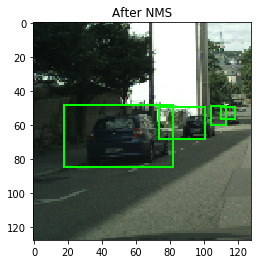

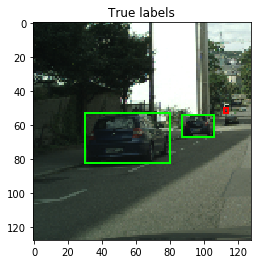

751


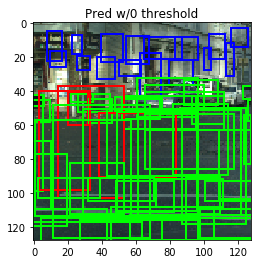

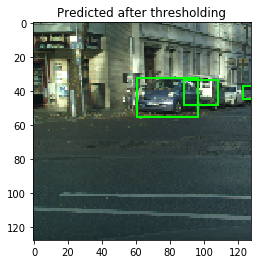

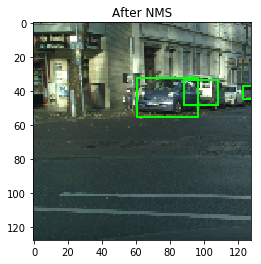

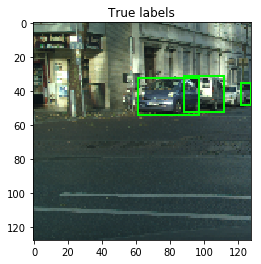

752


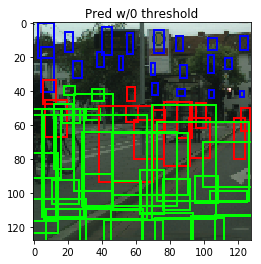

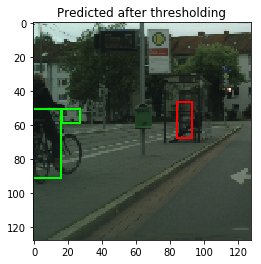

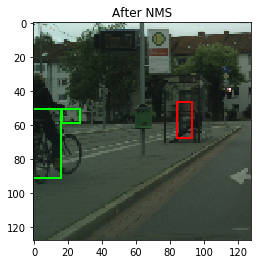

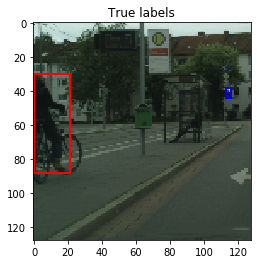

753


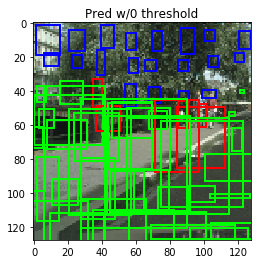

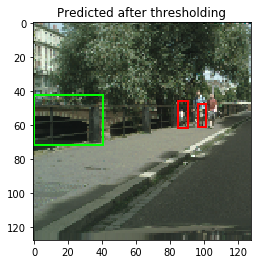

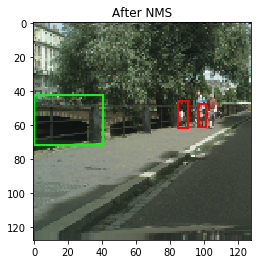

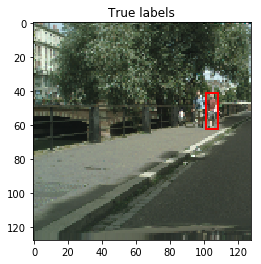

754


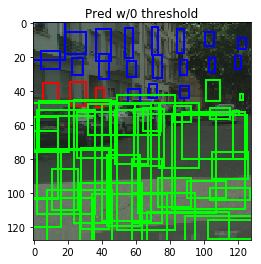

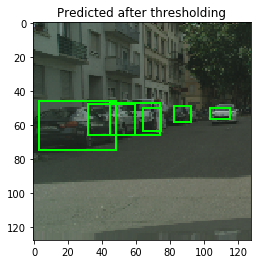

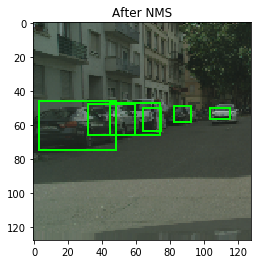

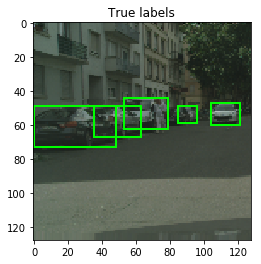

755


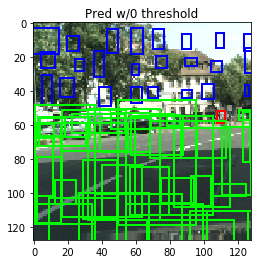

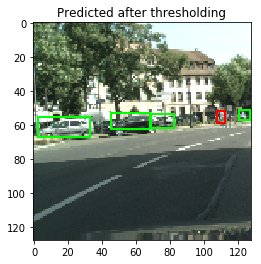

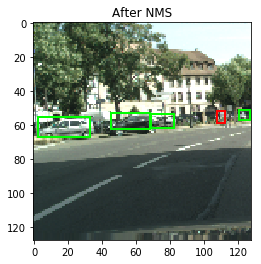

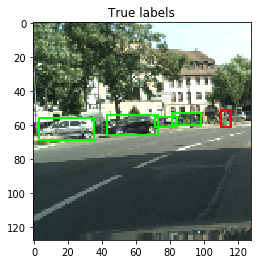

756


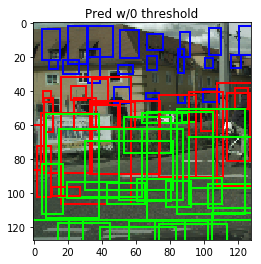

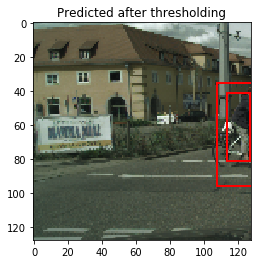

suppresion


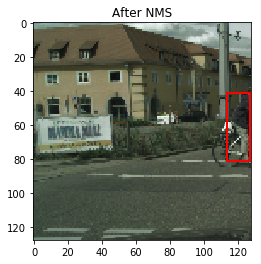

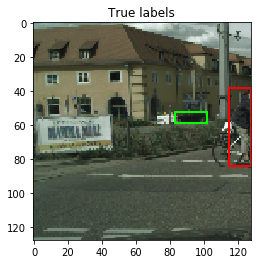

757


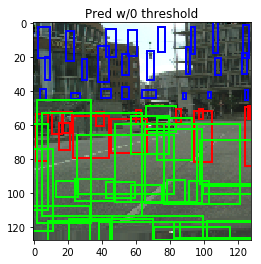

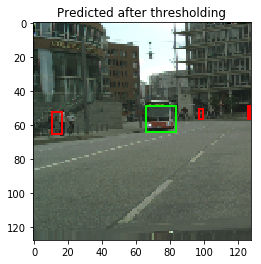

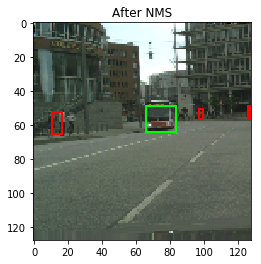

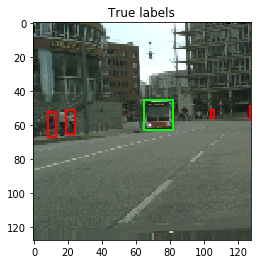

758


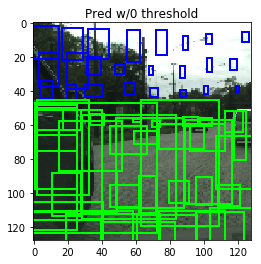

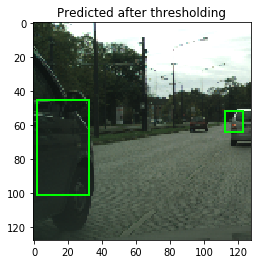

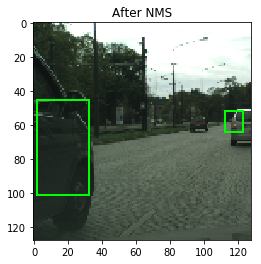

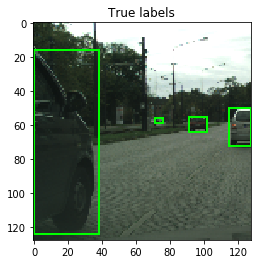

759


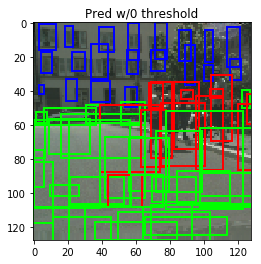

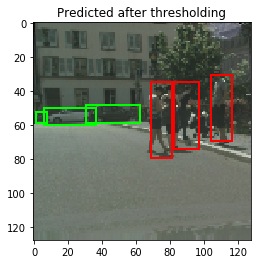

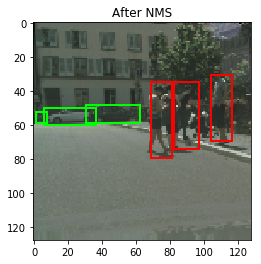

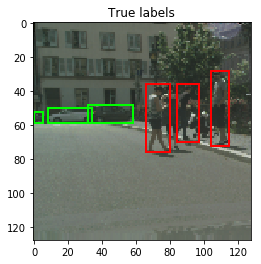

760


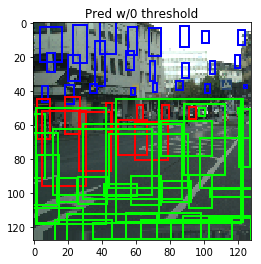

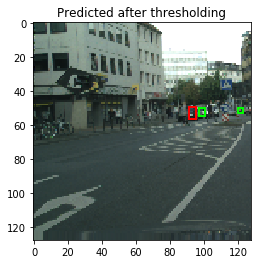

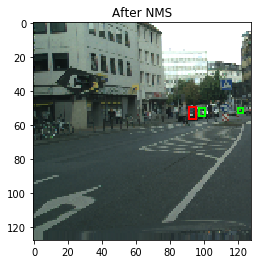

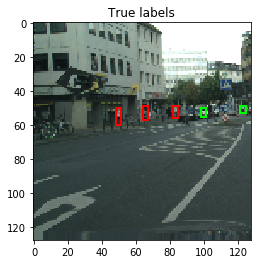

761


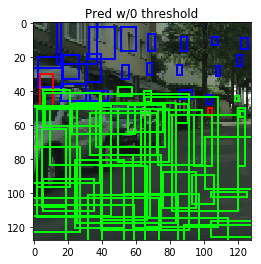

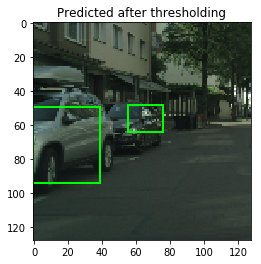

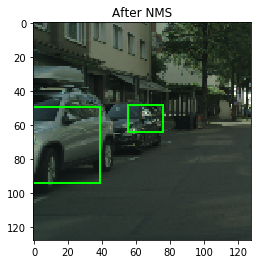

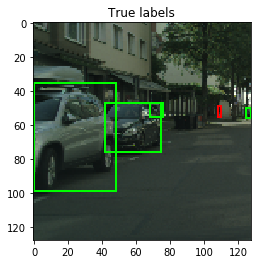

762


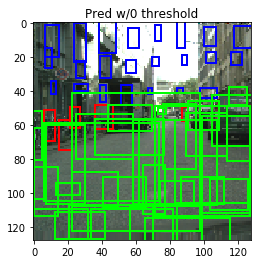

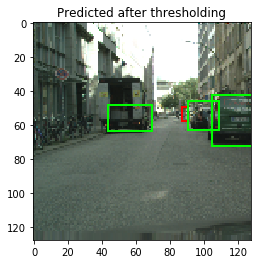

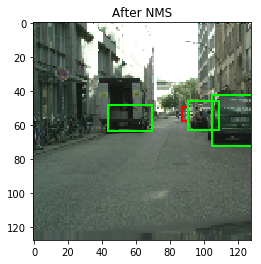

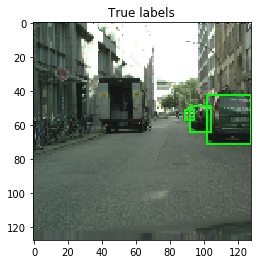

763


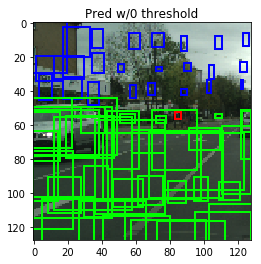

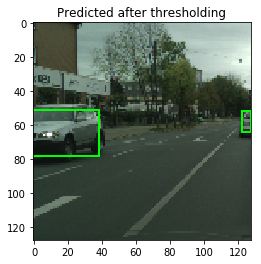

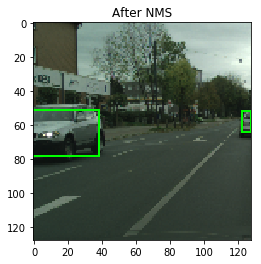

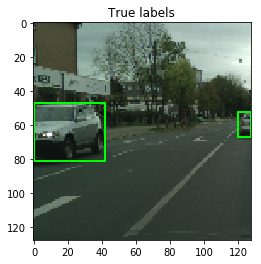

764


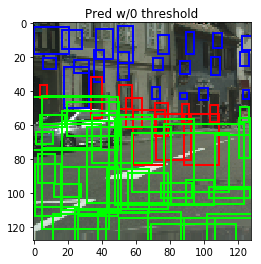

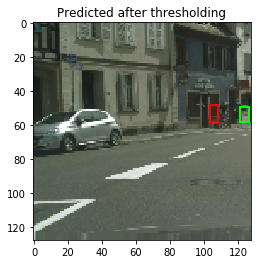

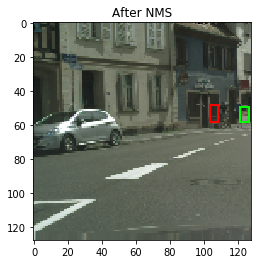

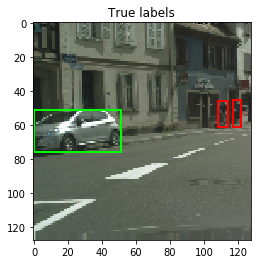

765


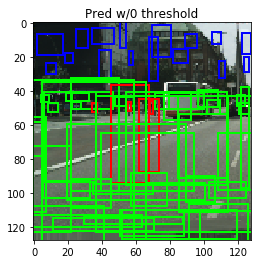

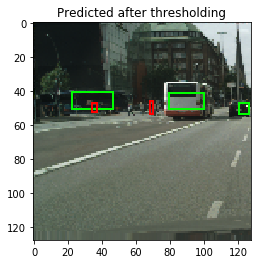

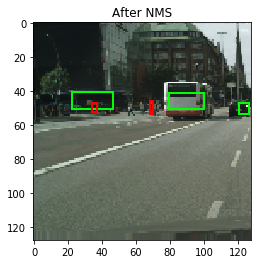

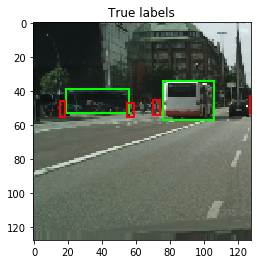

766


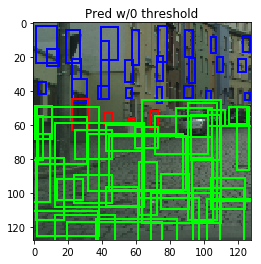

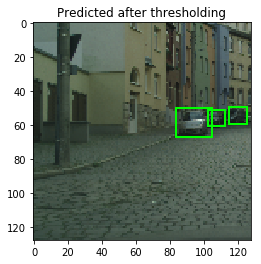

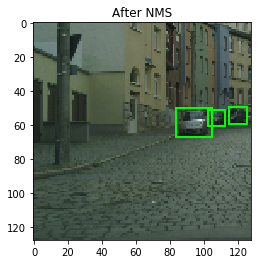

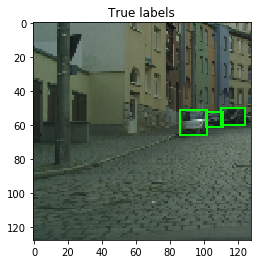

767


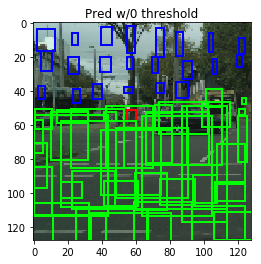

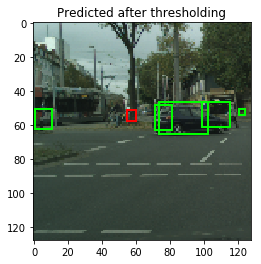

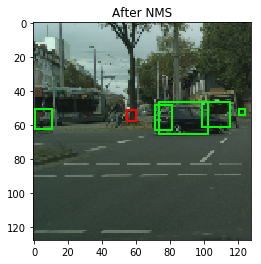

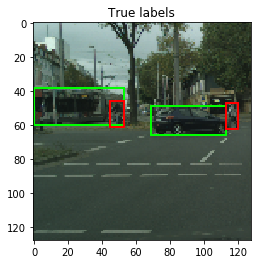

768


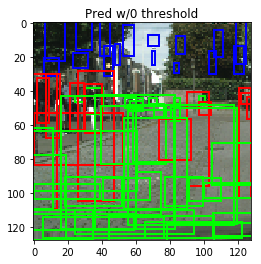

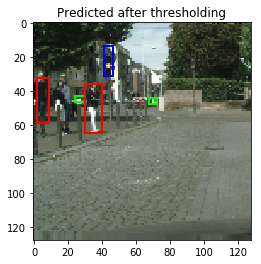

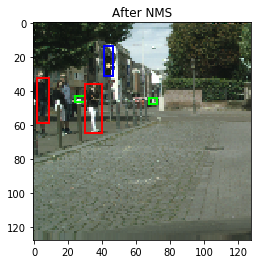

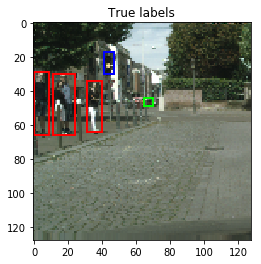

769


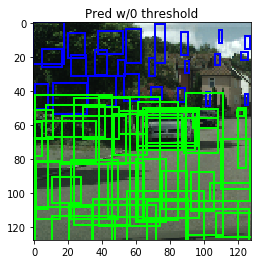

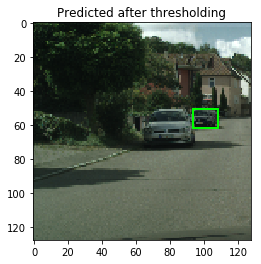

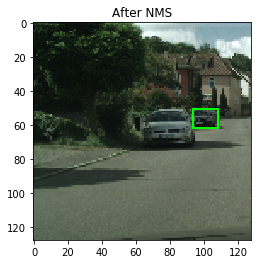

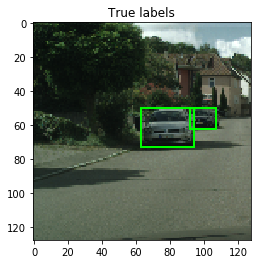

In [0]:
from sklearn import metrics
def plot_pr(x, y,title):
  plt.plot(y,x, color='green')
  plt.title(title)
  plt.show()
def avg_pr(nms_out, data, target,clss):
  idx_x, idx_y= torch.where((nms_out[:,:,0]>0) &(nms_out[:,:,clss]>0))
  tar_idx_x,tar_idx_y = torch.where((target[:,:,0]>0) & (target[:,:,clss]>0))
  # compare each of the cl_pred to all of cl_target
  hits=torch.zeros((idx_x.shape[0]))
  for i in range(0,idx_x.shape[0]):
    # for each pred bbox
    for j in range(0,tar_idx_x.shape[0]):
      # match indentified using IOU 
      pred , idx_i,idx_j = nms_out[idx_x[i],idx_y[i],:].cpu(), idx_x[i],idx_y[i]
      pred_x , pred_y,pred_w,pred_h = pred[1], pred[2],pred[3],pred[4]
      tar , tar_i,tar_j = target[tar_idx_x[j],tar_idx_y[j],:].cpu(), tar_idx_x[j],tar_idx_y[j]
      tar_x,tar_y,tar_w,tar_h = tar[1], tar[2], tar[3],tar[4]
      iou = IOU(pred_x+idx_j, pred_y+idx_i, pred_w,pred_h,tar_x+tar_j,tar_y+tar_i,tar_w,tar_h)
      if(iou>0.5):
        hits[i]= 1
  pr_obj = nms_out[idx_x,idx_y,0]

  return pr_obj,hits, tar_idx_x.shape[0]
  
def cal_ap(pr_obj,hits,tp_fn):

  pr_obj = torch.FloatTensor(pr_obj)
  hits = torch.FloatTensor(hits)
  conf_level , idxs = torch.sort(pr_obj,descending=True)
  x_re = hits[idxs] ## the x axis of the recall
  tp = 0
  fp=0
  pr = [None]* len(pr_obj)
  re = [ None]* len(pr_obj)
  for i in range(0,len(pr_obj)):
    if(x_re[i]==1):
      tp +=1
    else:
      fp+=1
    pr[i]= tp/(tp+fp)
    re[i] = tp/sum(tp_fn) 
  # plot pr curve 
  plot_pr(pr, re,'PR -curve')
  
  for i in range(len(pr)-2,-1,-1):
    if(pr[i]<pr[i+1]):
      pr[i]=pr[i+1]
  plot_pr(pr,re,'smooth PR_curve')
  return pr,re

def IOU(x1,y1,w1,h1,x2,y2,w2,h2):
  
  ## change the coords back to x,y in actual image
  w1= w1*128
  w2= w2*128
  h1= h1*128
  h2= h2*128
  x1= x1*16 - w1/2
  y1 =y1*16 - h1/2
  x2 =x2*16 - w2/2
  y2= y2*16 - h2/2
 
  boxA = [ x1,y1,x1+w1,y1+h1]
  boxB = [ x2,y2,x2+w2,y2+h2]
  # determine the (x, y)-coordinates of the intersection rectangle
  xA = max(boxA[0], boxB[0])
  yA = max(boxA[1], boxB[1])
  xB = min(boxA[2], boxB[2])
  yB = min(boxA[3], boxB[3])

  # compute the area of intersection rectangle
  interArea = max(0, xB - xA) * max(0, yB - yA )

  boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1] )
  boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1] )

  iou = interArea / float(boxAArea + boxBArea - interArea)

  return iou

def nms(x_c,y_c,output):
  for i in range(0,len(x_c)):
      for j in range(i+1,len(x_c)):
            if(x_c[j] >0 and y_c[j] >0 and x_c[i] >0 and y_c[i] >0):
              bbox1_i, bbox1_j = x_c[i],y_c[i]
              bbox1_xc , bbox1_yc = output[bbox1_i, bbox1_j,1], output[bbox1_i, bbox1_j,2]
              bbox1_w ,bbox1_h = output[bbox1_i, bbox1_j ,3],output[bbox1_i, bbox1_j ,4]
              bbox2_i, bbox2_j = x_c[j],y_c[j]
              bbox2_xc , bbox2_yc = output[bbox2_i, bbox2_j,1],  output[bbox2_i, bbox2_j,2]
              bbox2_w ,bbox2_h = output[bbox2_i, bbox2_j ,3],output[bbox2_i, bbox2_j ,4]
              ## YOU ARE PASSING RELATIVE here , conver in iou to actual bounding boxes. 
              iou = IOU(bbox1_xc+bbox1_j, bbox1_yc+bbox1_i,bbox1_w,bbox1_h,bbox2_xc+bbox2_j,bbox2_yc+bbox2_i,bbox2_w ,bbox2_h)
#               print(i," ",j , " ", iou)
              if(iou>0.4):
                print("suppresion")
                ## apply non max supression 
                obj_1, obj_2= output[bbox1_i, bbox1_j ,0],output[bbox2_i, bbox2_j ,0]
                if(obj_1>obj_2):
                  x_c[j],y_c[j]= -1,-1
                else:
                  x_c[i],y_c[i]= -1,-1

                  
  return x_c[x_c>=0],y_c[y_c>=0]
  
def test(model,data):
  model.eval()
  with torch.no_grad():
    inputs, labels = data[0].to(device,dtype= float),data[1].to(device,dtype=float)
#     print(inputs.shape)
    inputs = inputs.unsqueeze(0).transpose(1,3) ## add channels for adding batch size 
    output = model(inputs)
    output= output.squeeze()## remove batch size column from tensor 
     ## objectness is greater than 0.6 
    x,y=torch.where(output[:,:,0]>0.6) 
    plot3(data[0],output.cpu(),"Pred w/0 threshold")
#     plot3(data[0],plot_output,"Predicted after thresholding")
# 
    ## getting highest probability class and its number
#     print(len(x))
    if(len(x)>0):
      max_prob,max_class= torch.max(output[x,y,5:8],dim=1)
      plot_output = torch.zeros((8,8,8),dtype= float)
      plot_output[x,y,:] = output[x,y,:].cpu()
      plot3(data[0],plot_output,"Predicted after thresholding")


      x_c0 , y_c0 = x[max_class==0] ,y[max_class==0] 
      x_c1 , y_c1 = x[max_class==1], y[max_class==1]
      x_c2 , y_c2 = x[max_class==2], y[max_class==2]

      x_c0 , y_c0 = nms(x_c0 , y_c0,output) 
      x_c1 , y_c1 = nms(x_c1, y_c1,output) 
      x_c2 , y_c2 = nms(x_c2 , y_c2,output) 

      nms_target = torch.zeros((8,8,8),dtype= float)
      nms_target[x_c0,y_c0,:] = output[x_c0,y_c0,:].cpu()
      nms_target[x_c1,y_c1,:] = output[x_c1,y_c1,:].cpu()
      nms_target[x_c2,y_c2,:] = output[x_c2,y_c2,:].cpu()
      plot3(data[0],nms_target,"After NMS")
      plot3(data[0],labels,"True labels")
      ## only take the elements which are positive 
      #get the prob of objectness , scores and total hits
      pr0, h0, tp0 = avg_pr(nms_target, inputs,labels,5)
      pr1,h1 ,tp1 =  avg_pr(nms_target, inputs,labels,6)
      pr2,h2 ,tp2 =  avg_pr(nms_target, inputs,labels,7)
      
      return pr0,h0,tp0, pr1,h1,tp1,pr2,h2,tp2
    
    else:
      c1,tar_idx_y = torch.where((labels[:,:,0]>0) & (labels[:,:,5]>0))
      c2,tar_idx_y = torch.where((labels[:,:,0]>0) & (labels[:,:,6]>0))
      c3,tar_idx_y = torch.where((labels[:,:,0]>0) & (labels[:,:,7]>0))
#       print(c1.shape[0])
      return 0,0,c1.shape[0],0,0,c2.shape[0],0,0,c3.shape[0]
#     cal_ap(pr, h, tp)
    

def test_pr(model1,test_loader):
  pr_total1=[]
  re_total =[]
  pr1=[]
  re1=[]
  tp_fn1 =[]
  pr2=[]
  re2=[]
  tp_fn2 =[]
  pr3=[]
  re3=[]
  tp_fn3 =[]
  ## 41 for ped
  for idx in range(720,770):
    print(idx)
    p1,r1,t1,p2,r2,t2,p3,r3,t3=test(model1,test_loader.dataset[idx])
    pr1.append(p1)
    re1.append(r1)
    tp_fn1.append(t1)
    pr2.append(p2)
    re2.append(r2)
    tp_fn2.append(t2)
    pr3.append(p3)
    re3.append(r3)
    tp_fn3.append(t3)
   ## return the objs , recals, tp 
  return pr1,re1,tp_fn1,pr2,re2,tp_fn2,pr3,re3,tp_fn3


## passing the images in the test_loader for calculating the average precision, NMS , thresholding
pr1,re1,tp_fn1,pr2,re2,tp_fn2,pr3,re3,tp_fn3=test_pr(model1,test_loader)


# Test your network

Did you remember to cut out a test set? If not you really should, test on images your network has never seen.

[0.6350860892625028, 0.9929464716887924, 0.994526106984094, 0.8164105949843778, 0.9837333876565888, 0.7146207883338795, 0.655297496260446, 0.9959401943867682, 0.9714764702405638, 0.6296425889858951, 0.9159613747402585, 0.6193358099302888, 0.6671895780455742, 0.9993125110217377, 0.99850049678907, 0.6960354449560302, 0.9261533246236114, 0.9914725127652322, 0.9956050621610544, 0.8880392099117167, 0.9916382555322316, 0.7649927630606703, 0.6836253651372576, 0.995735025505795, 0.9746251509325897, 0.9991876901790941, 0.9903466693929714, 0.9652490092193291, 0.8549636958226677, 0.9986676614739537, 0.9963991027547197, 0.9989183461236889, 0.9594051568715494, 0.9249297536772121, 0.992237111764903, 0.9942193234941763, 0.9998966211362146, 0.9806662987105106, 0.9403325572500525, 0.9568343412835363, 0.8365239402532617, 0.9368511609476724, 0.9794739637739931, 0.9868674160675722, 0.9856387380797685, 0.8461204212921664, 0.9756908095312925, 0.8443126216673656, 0.931583888553872, 0.6959512824111886, 0.8256

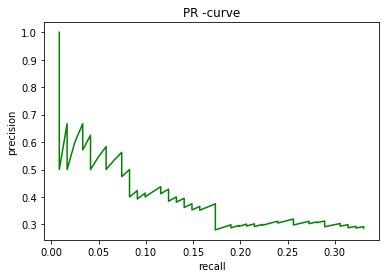

[1.0, 0.5, 0.6666666666666666, 0.5, 0.6, 0.6666666666666666, 0.5714285714285714, 0.625, 0.5555555555555556, 0.5, 0.5454545454545454, 0.5833333333333334, 0.5384615384615384, 0.5, 0.5333333333333333, 0.5625, 0.5294117647058824, 0.5, 0.47368421052631576, 0.5, 0.47619047619047616, 0.45454545454545453, 0.43478260869565216, 0.4166666666666667, 0.4, 0.4230769230769231, 0.4074074074074074, 0.39285714285714285, 0.41379310344827586, 0.4, 0.41935483870967744, 0.4375, 0.42424242424242425, 0.4117647058823529, 0.42857142857142855, 0.4166666666666667, 0.40540540540540543, 0.39473684210526316, 0.38461538461538464, 0.4, 0.3902439024390244, 0.38095238095238093, 0.3953488372093023, 0.38636363636363635, 0.37777777777777777, 0.3695652173913043, 0.3617021276595745, 0.375, 0.3673469387755102, 0.36, 0.35294117647058826, 0.36538461538461536, 0.3584905660377358, 0.35185185185185186, 0.36363636363636365, 0.375, 0.3684210526315789, 0.3620689655172414, 0.3559322033898305, 0.35, 0.3442622950819672, 0.33870967741935

In [0]:
## once  you have gotten the 
def plot_pr(x, y,title):
  plt.plot(y,x, color='green')
  plt.xlabel('recall')
  plt.ylabel('precision')
  plt.title(title)
  plt.show()
def cal_ap(pr_obj,hits,tp_fn):

  pr_obj = torch.FloatTensor(pr_obj)
  hits = torch.FloatTensor(hits)
  conf_level , idxs = torch.sort(pr_obj,descending=True)
  x_re = hits[idxs] ## the x axis of the recall
  tp = 0
  fp=0
  pr = [None]* len(pr_obj)
  re = [ None]* len(pr_obj)
  for i in range(0,len(pr_obj)):
    if(x_re[i]==1):
      tp +=1
    else:
      fp+=1
    pr[i]= tp/(tp+fp)
    re[i] = tp/sum(tp_fn) 
  
  # plot pr curve 
  plot_pr(pr, re,'PR -curve')
  
#   for i in range(len(pr)-2,-1,-1):
#     if(pr[i]<pr[i+1]):
#       pr[i]=pr[i+1]
      
#   plot_pr(pr,re,'smooth PR_curve')
  return pr,re
 
def  cal_area(pr1,re1,tp_fn1):
  obj1 =[]
  rec1=[]
  pr_x=pr1
  re_x= re1
  tp_x = tp_fn1
  for i in range(0,len(pr_x)):
    for j in range(0,len(pr_x[i])):
      obj1.append(pr_x[i][j].item())

  for i in range(0,len(re_x)):
    for j in range(0,len(re_x[i])):
      rec1.append(re_x[i][j].item())

  print(obj1, rec1)
  x,y  =cal_ap(obj1,rec1,tp_x)
  a=0
  r_prev =0
  for i in range(0,len(y)-1):
    if(i==len(y)-1 or (y[i]!=y[i+1])):
      a+= x[i]*(y[i]-r_prev)
      r_prev = y[i]

  return a 

## depending on the class change 1- ped , 2-traffic , 3-cars

a =cal_area(pr3,re3,tp_fn3)


 **mAP** To train the model with map run all the cells above and then run this 




Epoch 1/40


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1350: UserWarning: nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.
  warnings.warn("nn.functional.sigmoid is deprecated. Use torch.sigmoid instead.")


6.628011446253799
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


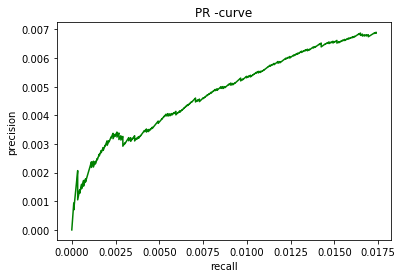

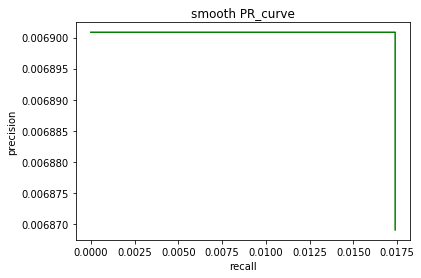

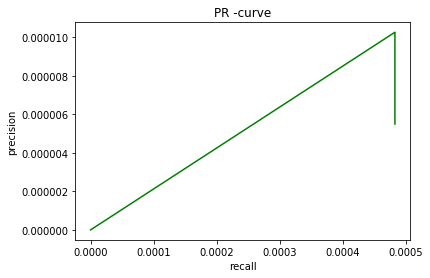

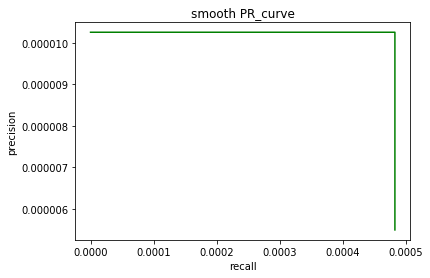

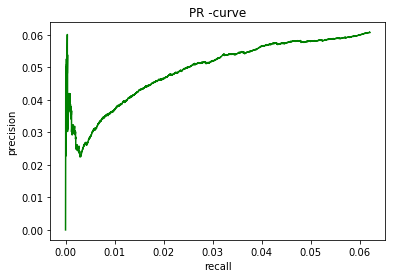

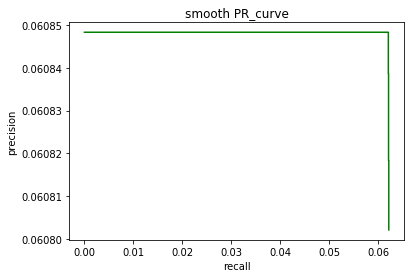

0.001298351942651952
Epoch 2/40
5.20615518041632
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


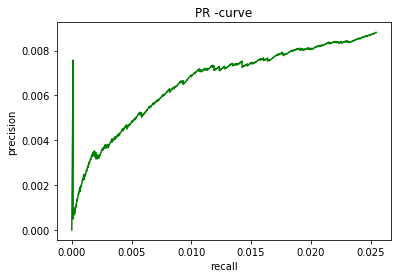

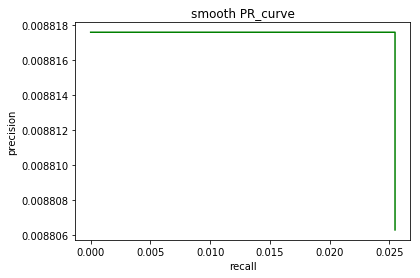

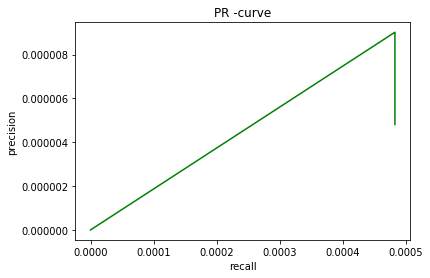

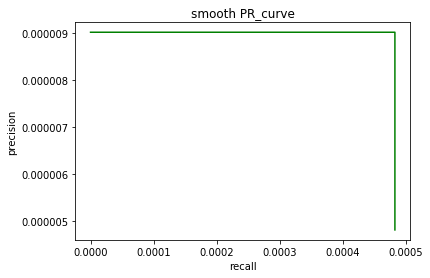

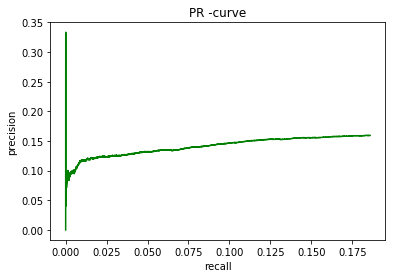

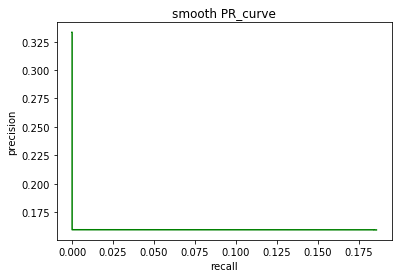

0.009949900278075113
Epoch 3/40
4.626177901011782
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
supp

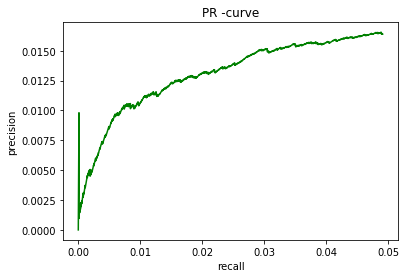

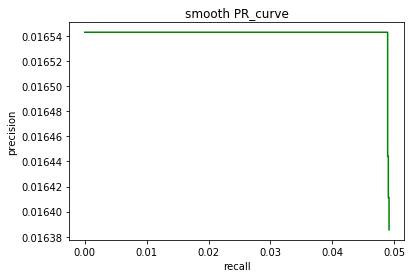

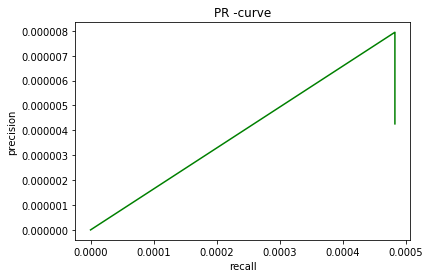

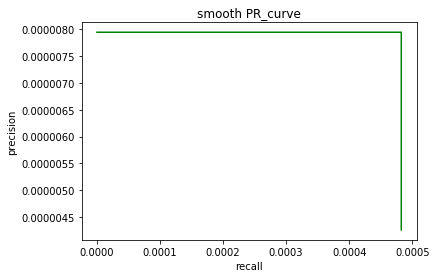

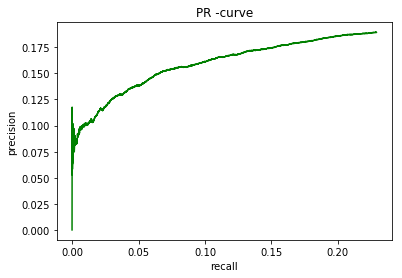

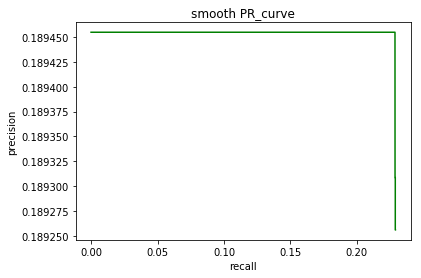

0.014727686124483797
Epoch 4/40
4.14005934379928
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppr

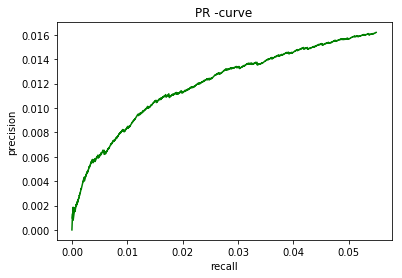

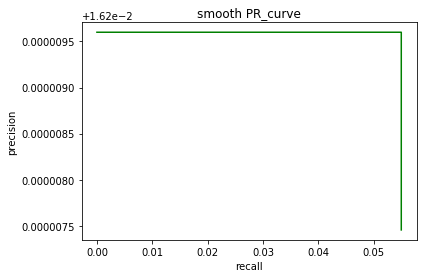

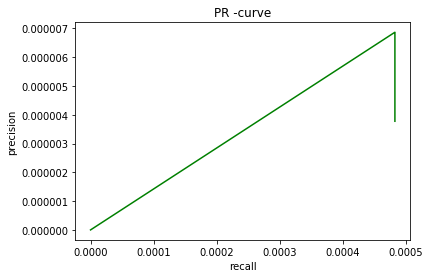

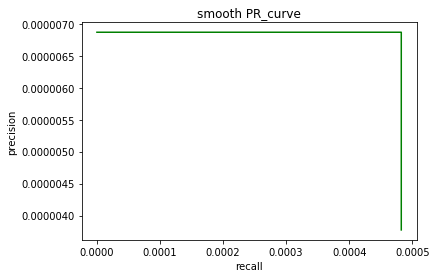

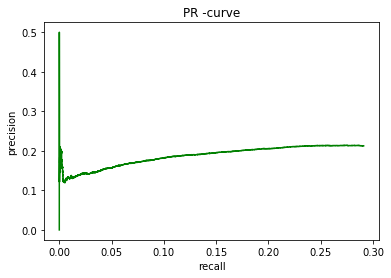

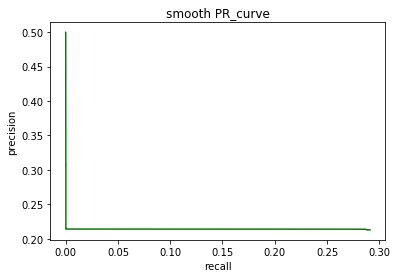

0.02106371064659907
Epoch 5/40
3.7057499479471563
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
supp

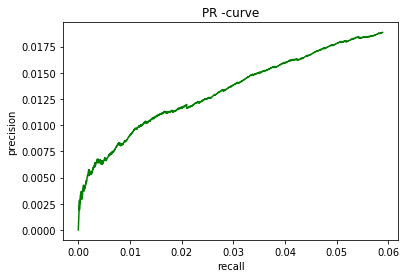

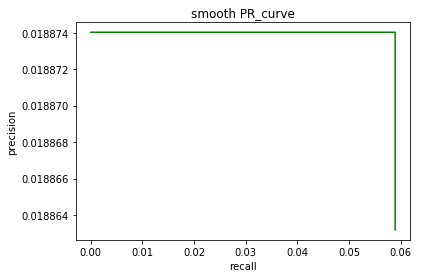

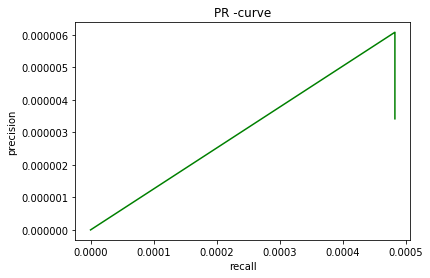

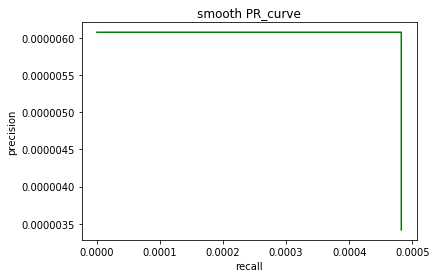

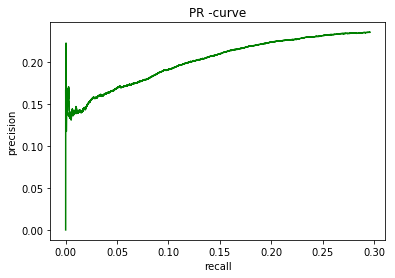

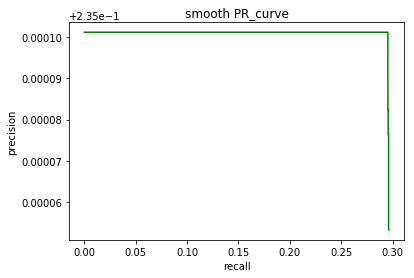

0.02357069296137647
Epoch 6/40
3.251811965416532
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppr

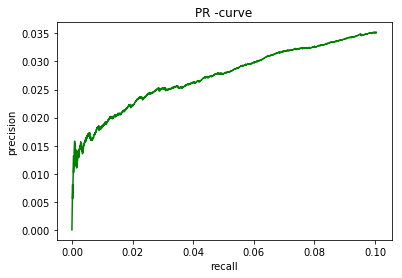

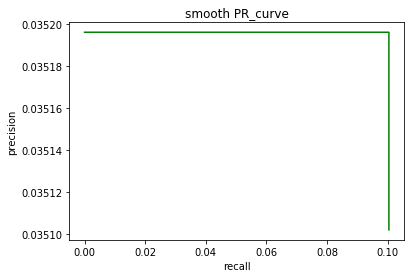

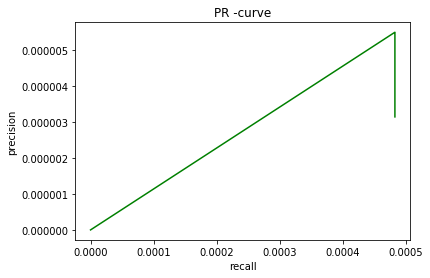

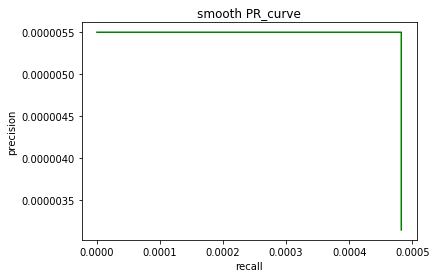

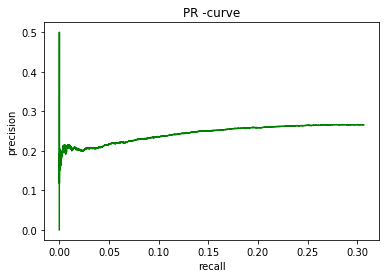

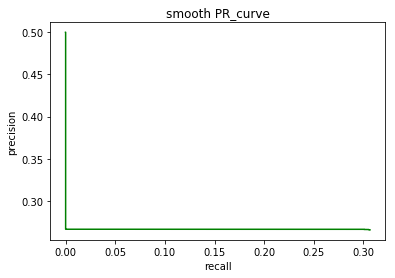

0.02838613605522912
Epoch 7/40
2.8060522204284375
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
supp

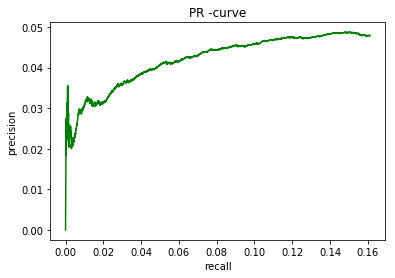

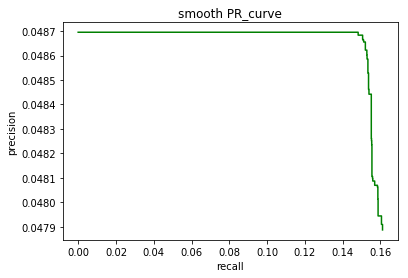

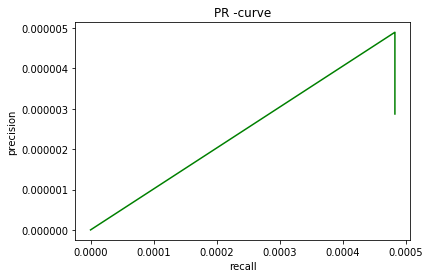

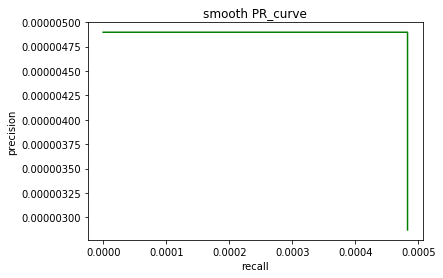

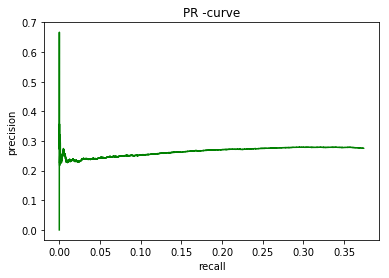

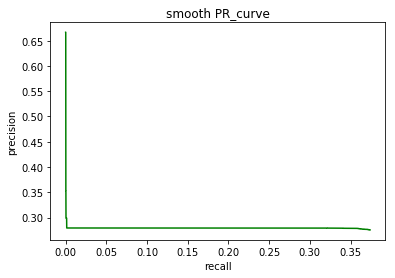

0.037418431049705776
Epoch 8/40
2.3261744144114713
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
sup

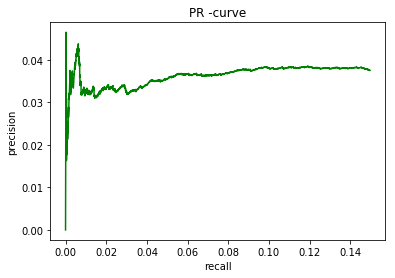

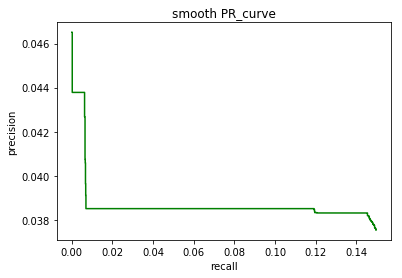

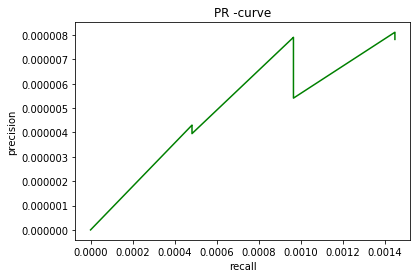

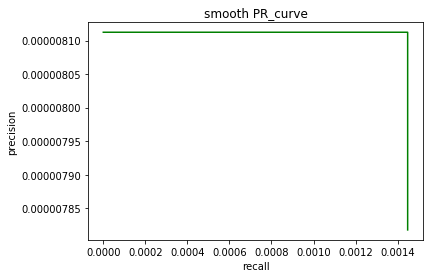

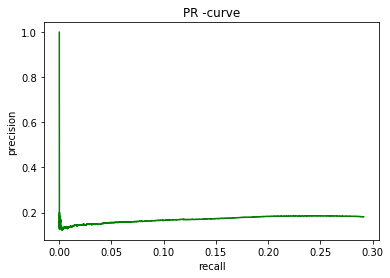

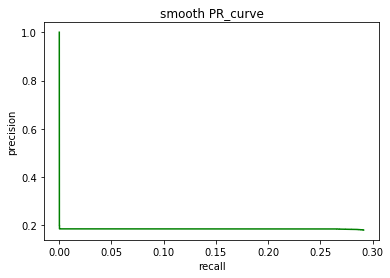

0.019932419724452533
Epoch 9/40
1.9600660358292281
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
sup

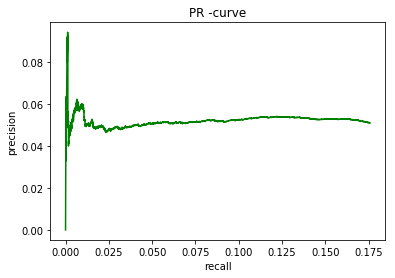

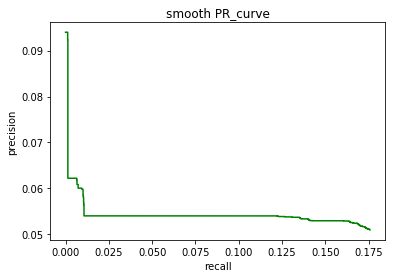

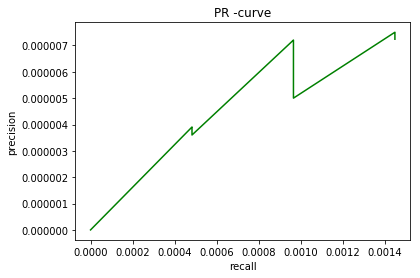

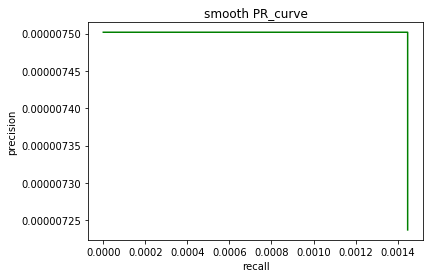

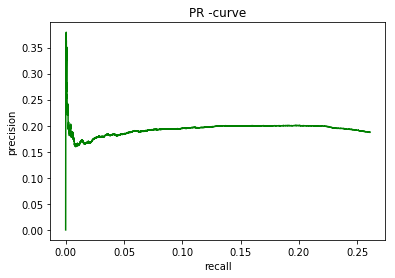

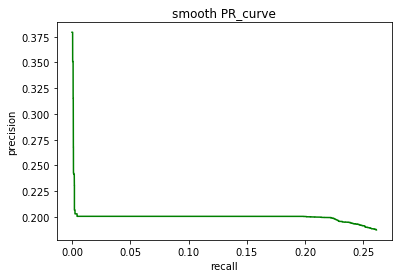

0.020605526001800347
Epoch 10/40
1.6299938085747445
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
su

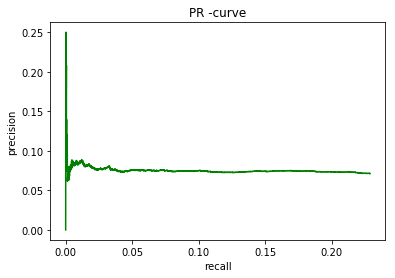

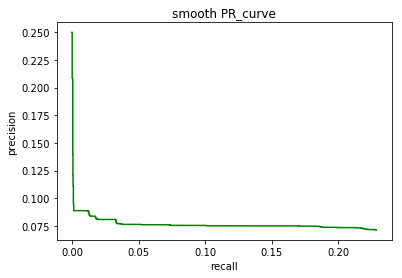

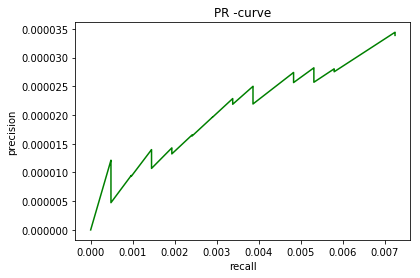

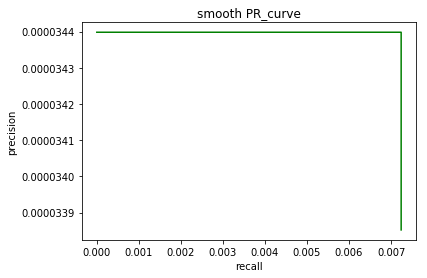

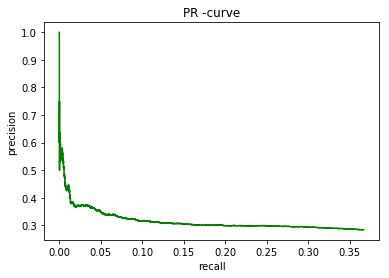

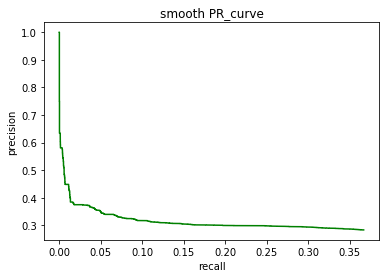

0.04470266296849942
Epoch 11/40
1.3463648502943522
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
sup

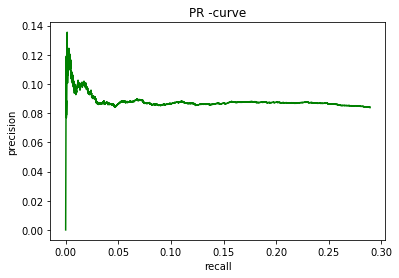

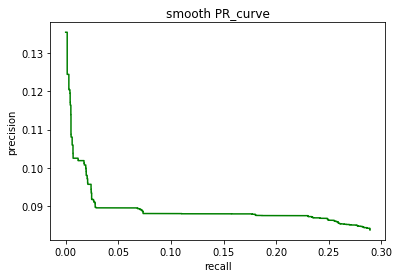

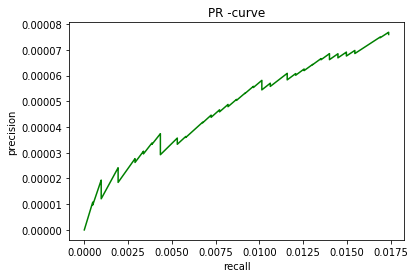

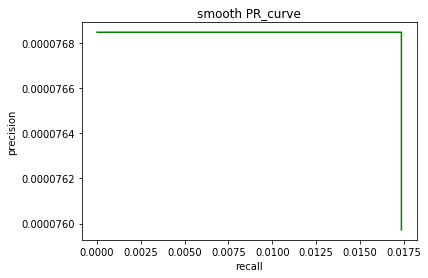

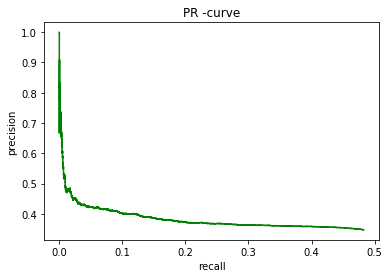

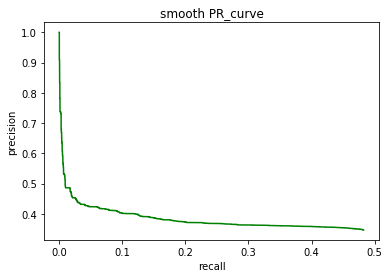

0.07049716625096702
Epoch 12/40
1.1151945786310893
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
sup

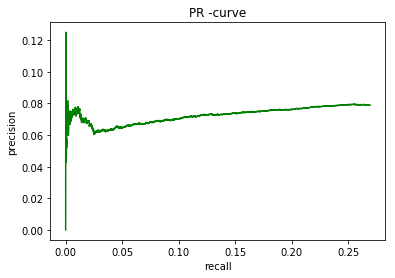

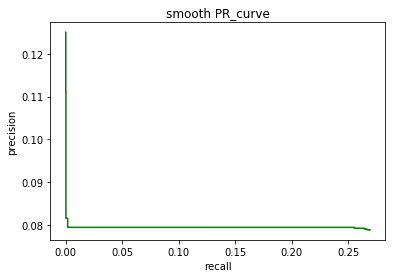

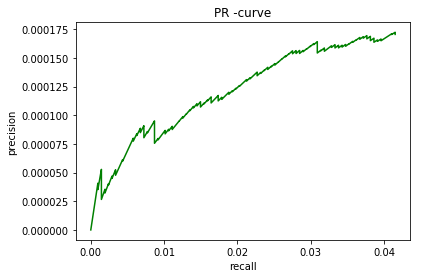

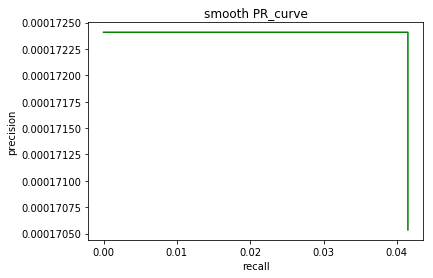

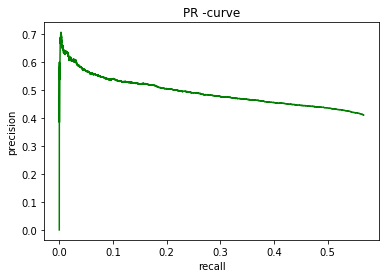

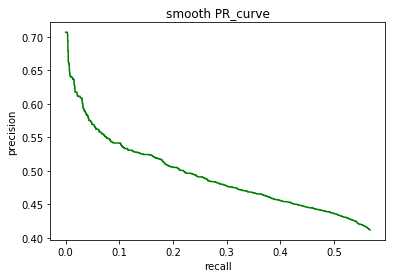

0.10034282548493596
Epoch 13/40
0.952638454695365
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
supp

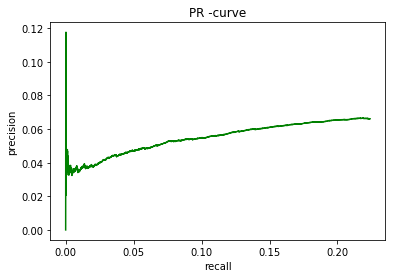

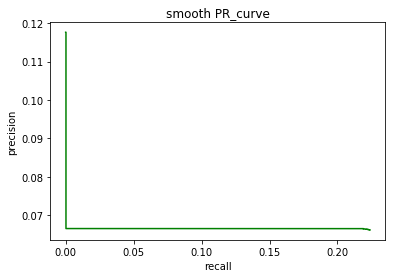

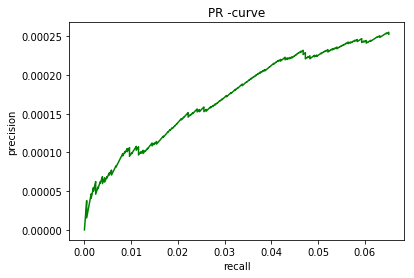

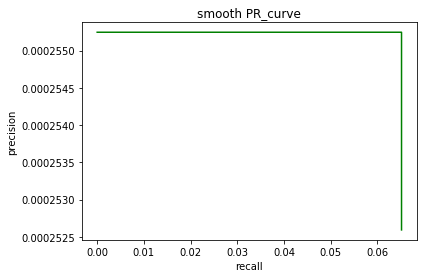

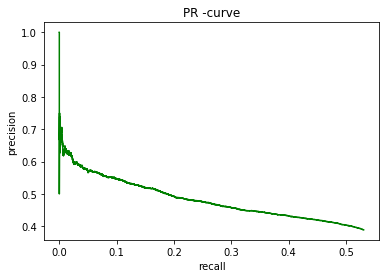

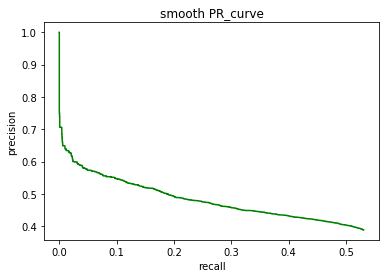

0.09059380280888524
Epoch 14/40
0.8383168723453198
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
sup

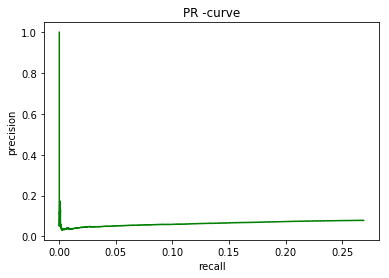

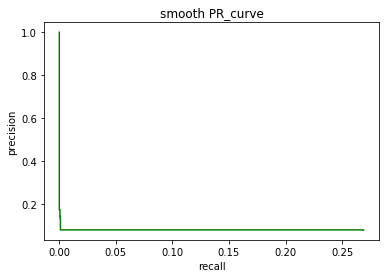

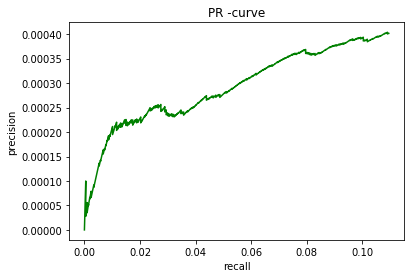

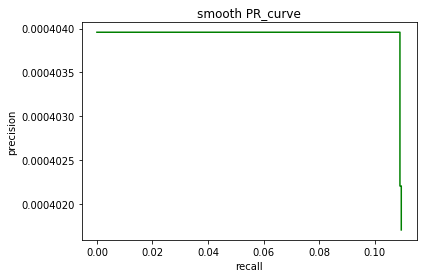

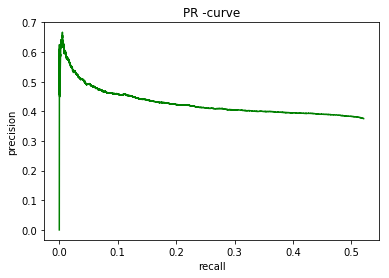

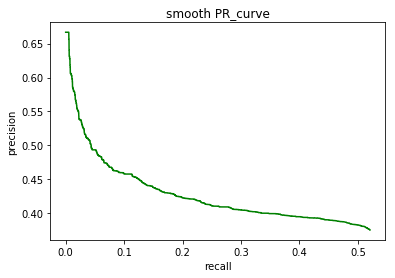

0.08156052422665275
Epoch 15/40
0.7453406602828145
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


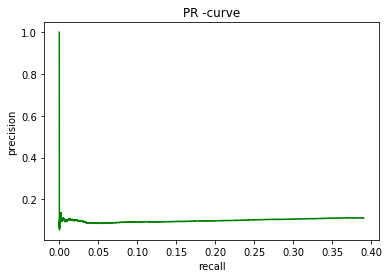

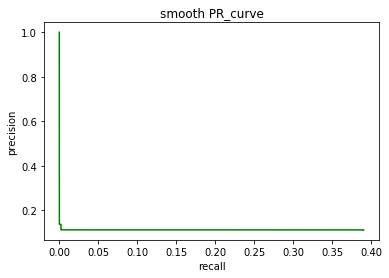

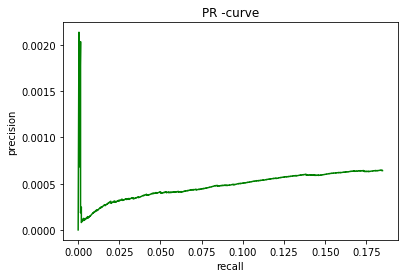

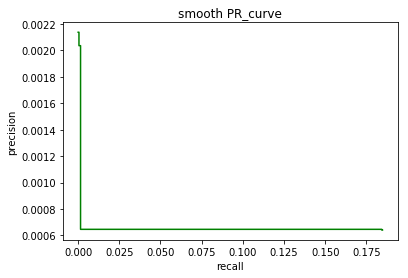

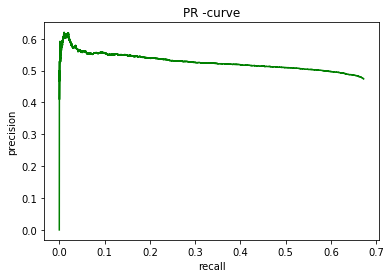

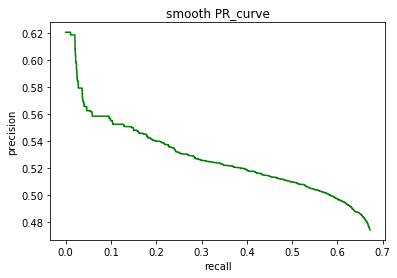

0.13288243408860448
Epoch 16/40
0.6547407930719528
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


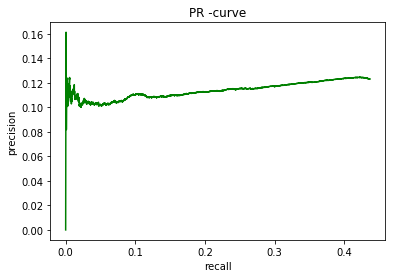

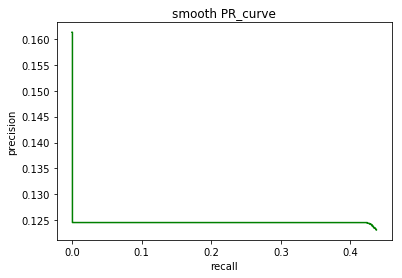

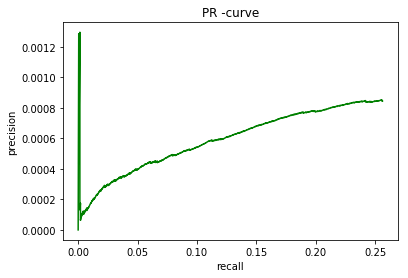

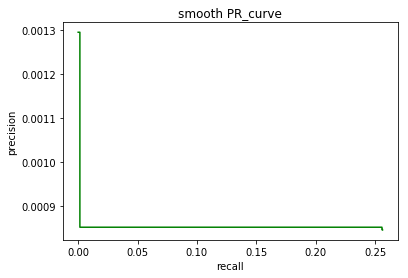

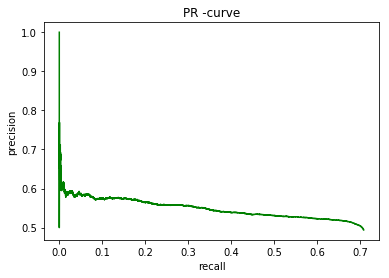

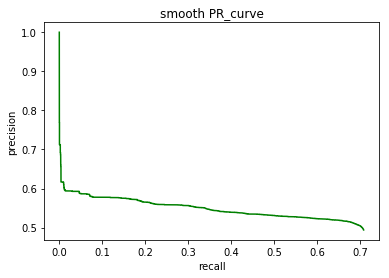

0.14797804733040237
Epoch 17/40
0.5577257093966947
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


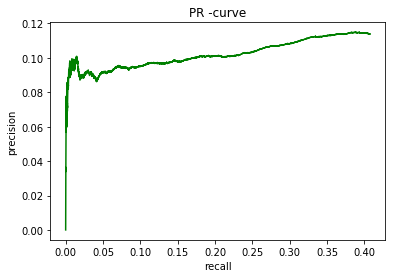

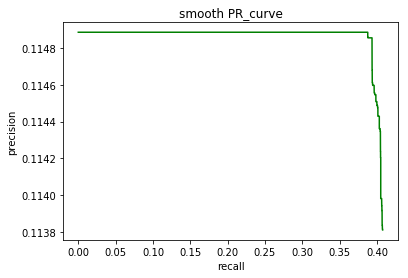

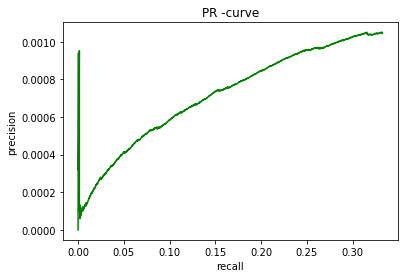

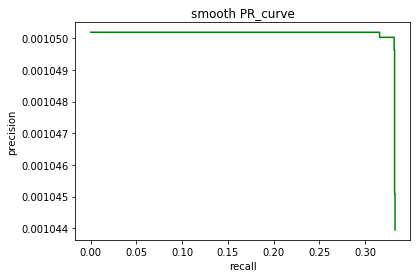

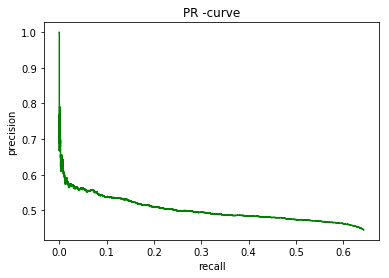

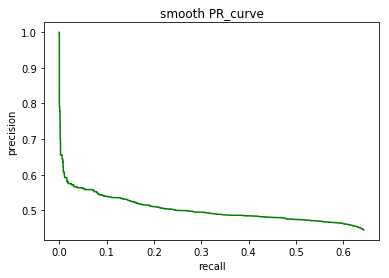

0.12355800657565273
Epoch 18/40
0.47398545928414143
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


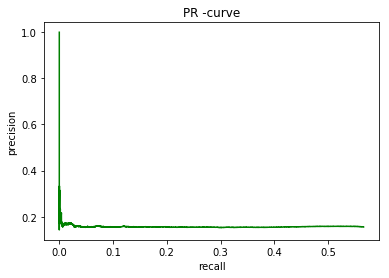

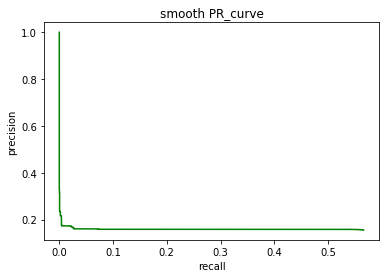

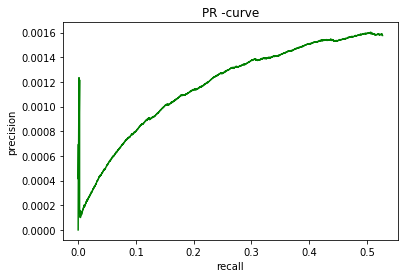

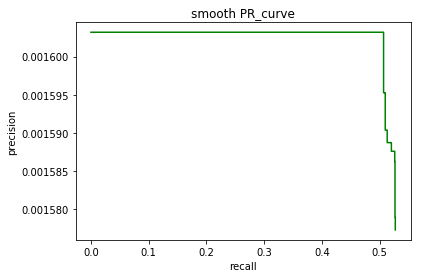

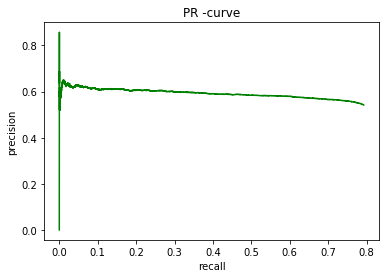

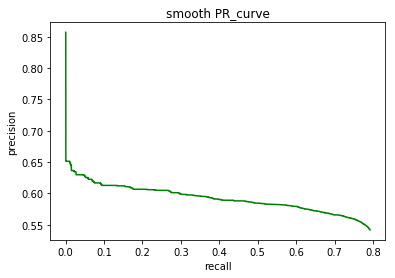

0.18698800655385184
Epoch 19/40
0.41377138576829153
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


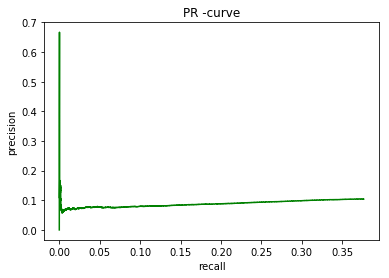

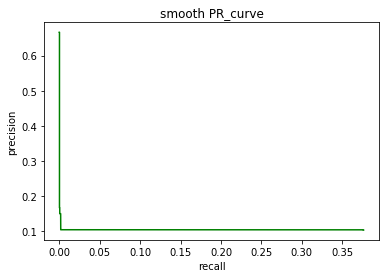

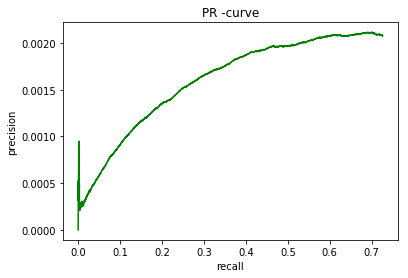

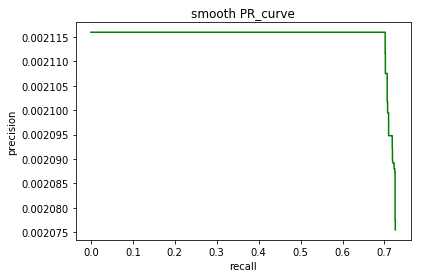

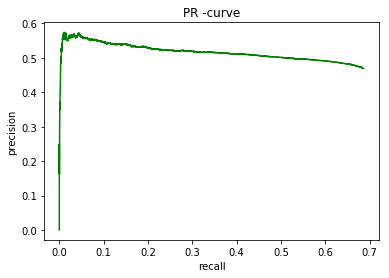

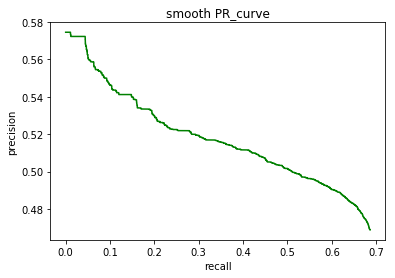

0.13224759834505037
Epoch 20/40
0.37993492909181625
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


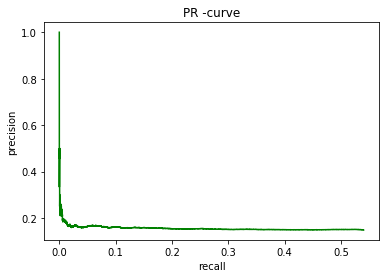

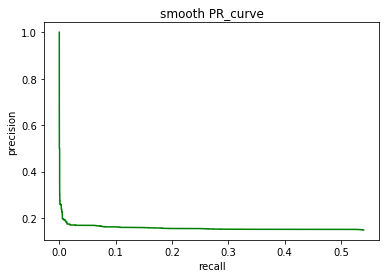

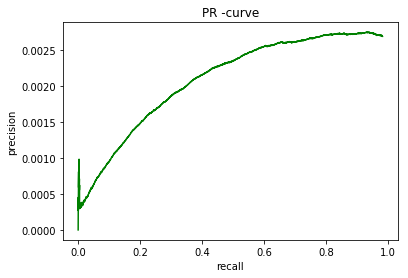

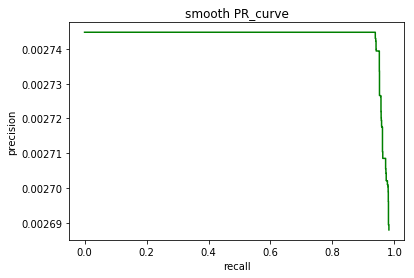

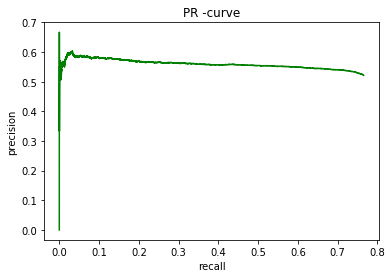

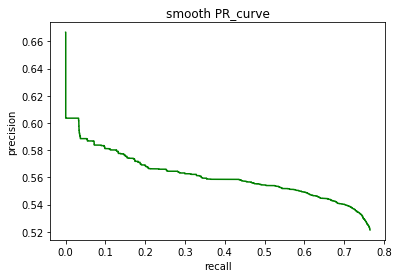

0.1723332462801963
Epoch 21/40
0.3591181546988759
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


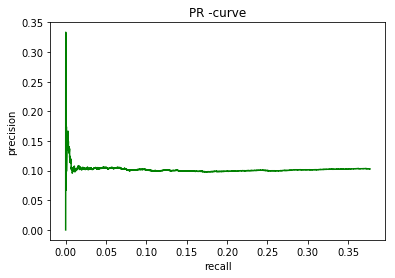

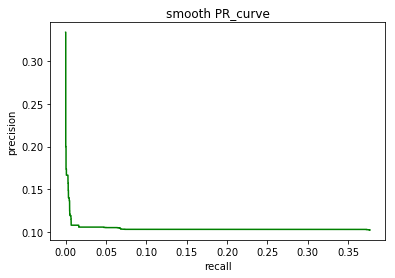

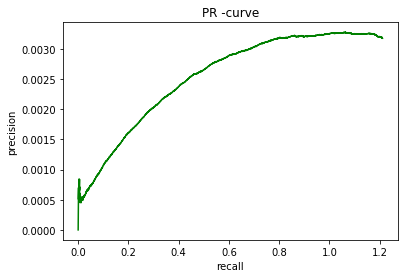

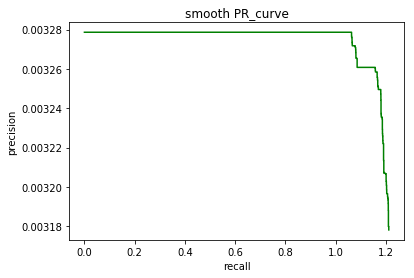

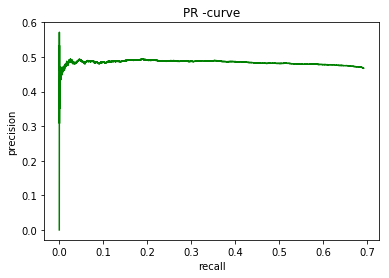

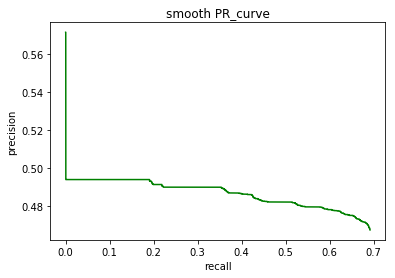

0.1266461436731598
Epoch 22/40
0.3380615341175977
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


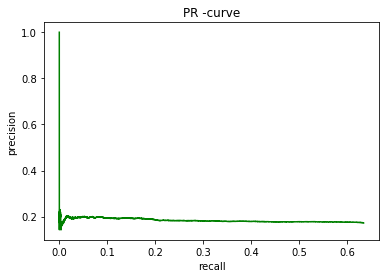

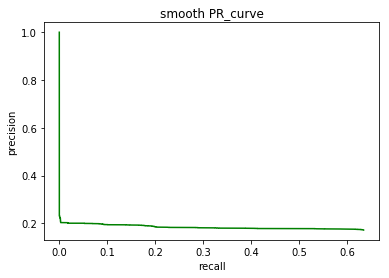

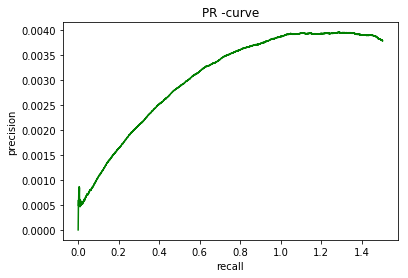

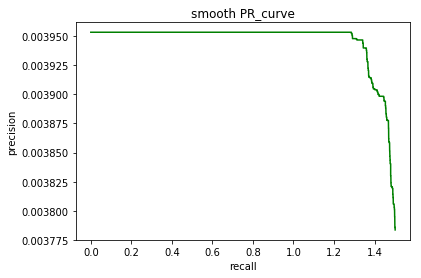

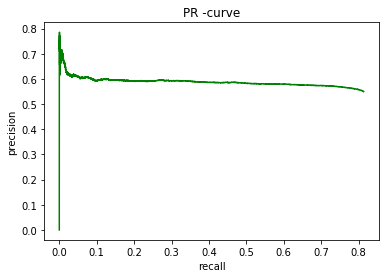

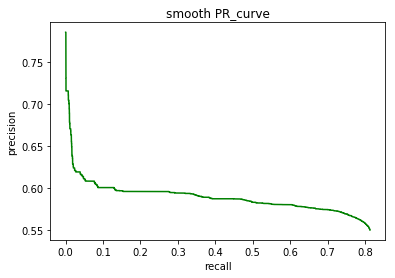

0.20090897453158615
Epoch 23/40
0.3167489099660521
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


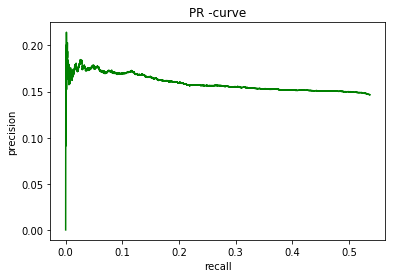

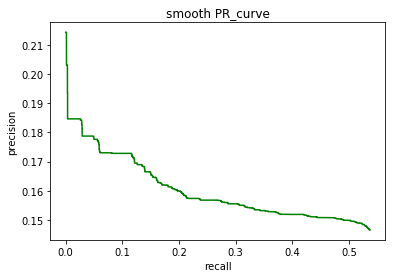

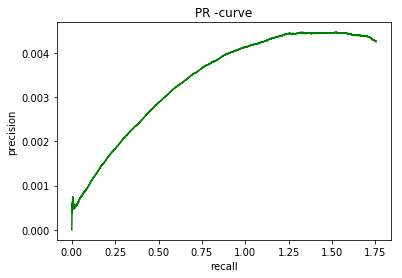

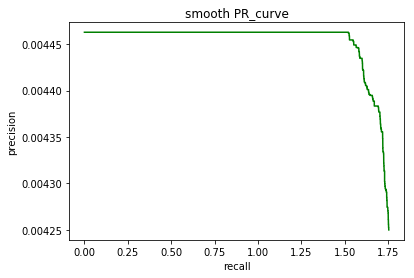

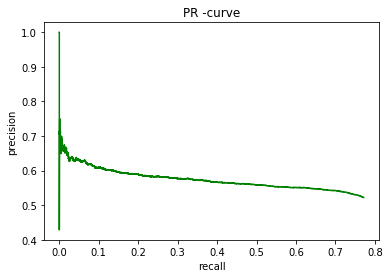

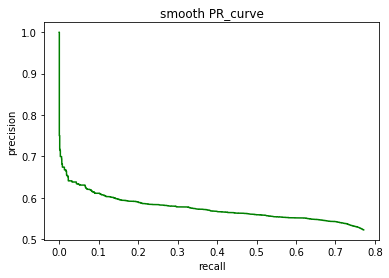

0.1792788906535778
Epoch 24/40
0.29744950138214016
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


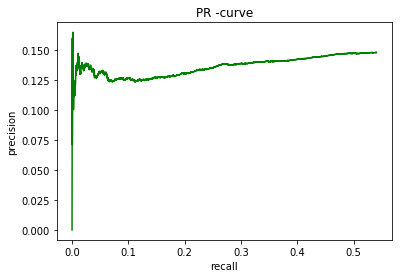

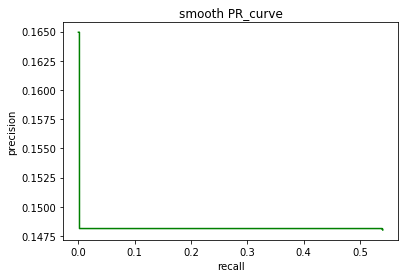

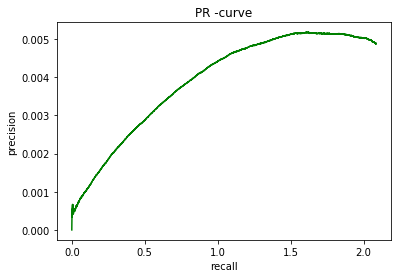

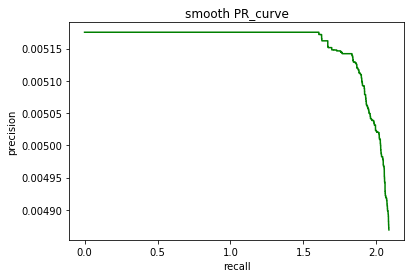

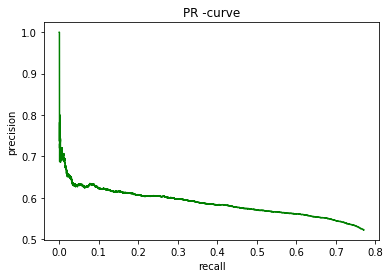

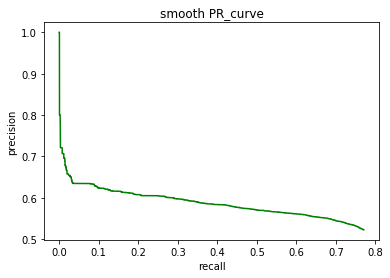

0.18144944096273422
Epoch 25/40
0.2865488960157231
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


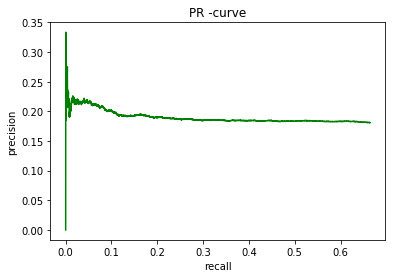

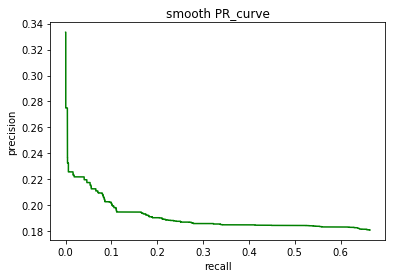

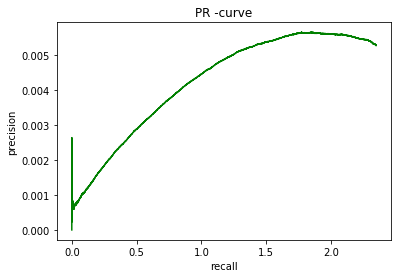

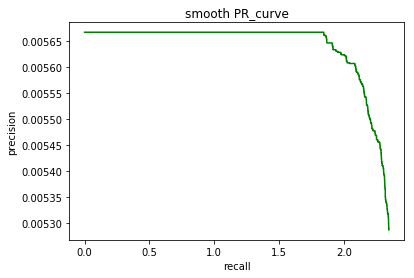

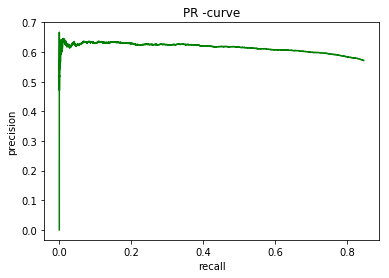

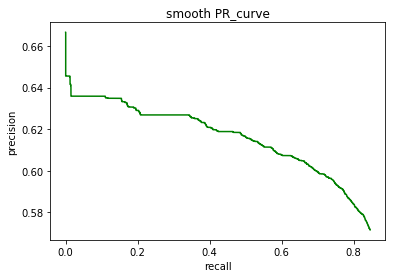

0.22062708727414151
Epoch 26/40
0.289774563015633
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


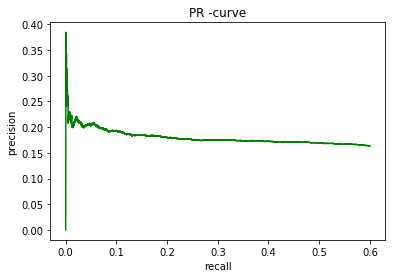

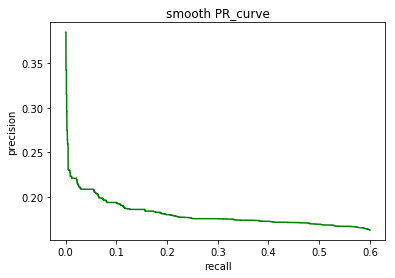

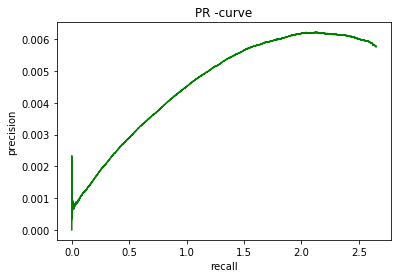

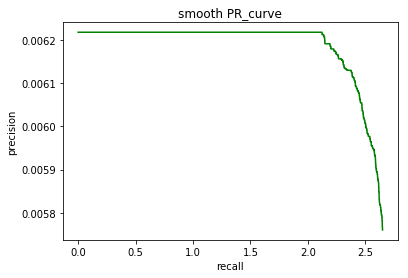

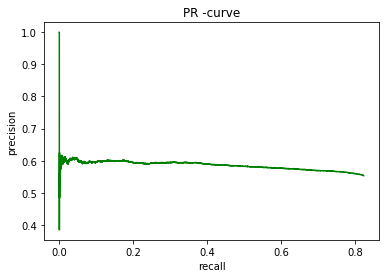

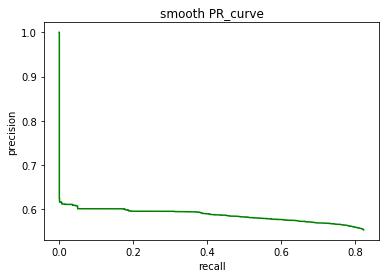

0.20258178814987773
Epoch 27/40
0.2839755376126534
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


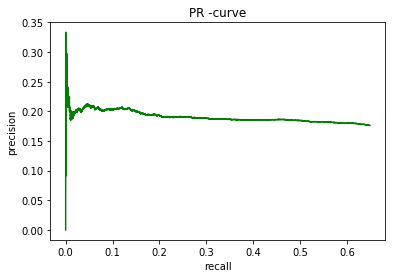

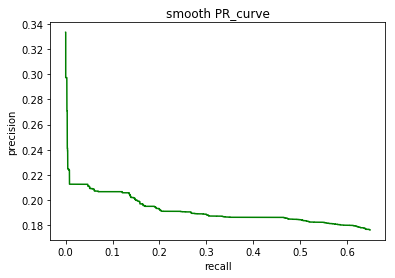

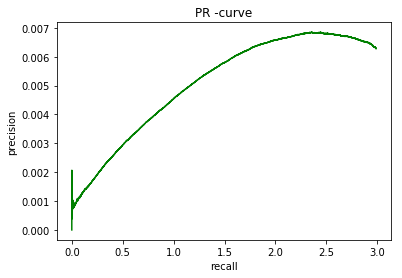

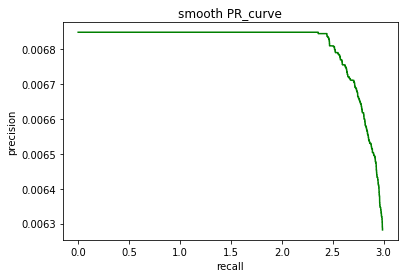

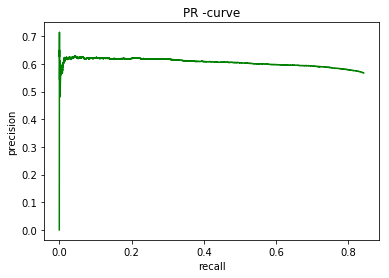

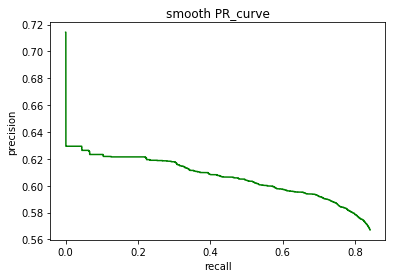

0.2186649196232259
Epoch 28/40
0.25929207397730286
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


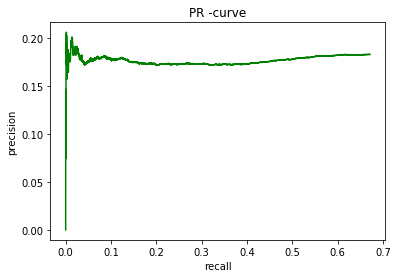

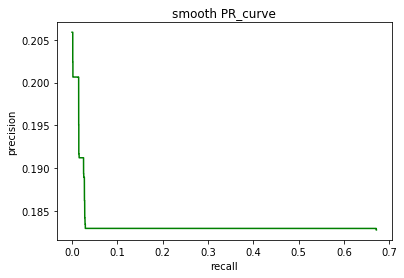

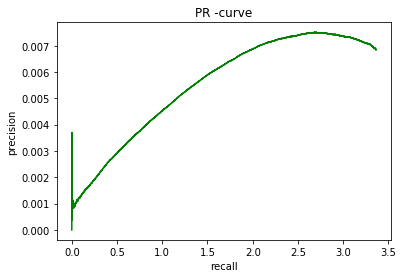

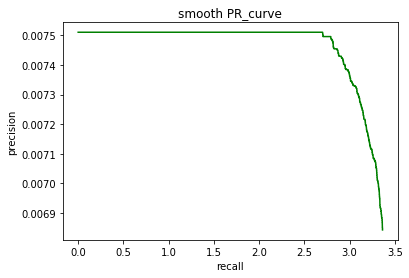

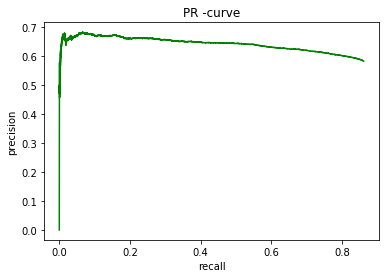

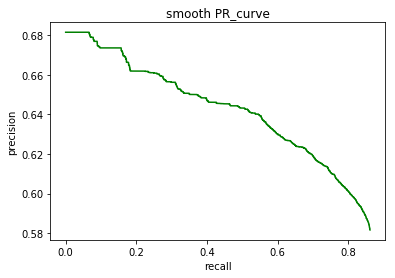

0.23425493941211317
Epoch 29/40
0.2290340801152926
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


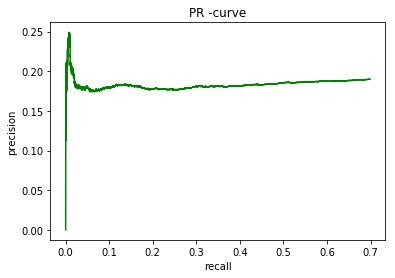

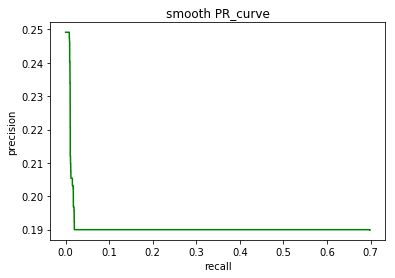

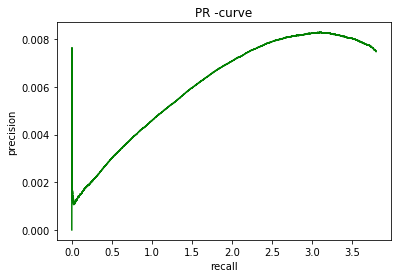

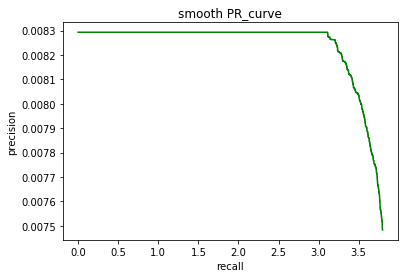

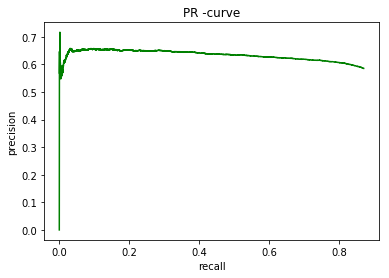

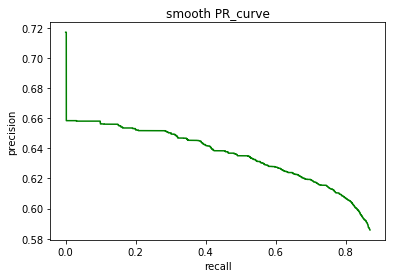

0.23941318899382366
Epoch 30/40
0.21173982777895536
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


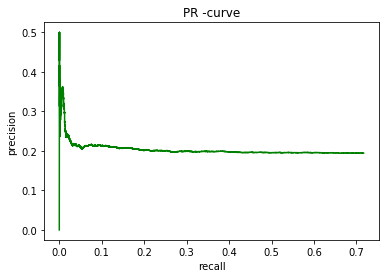

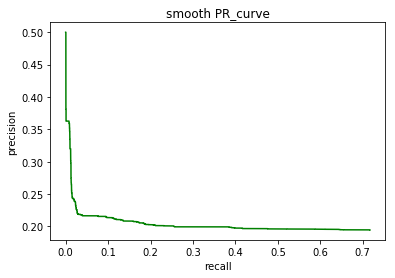

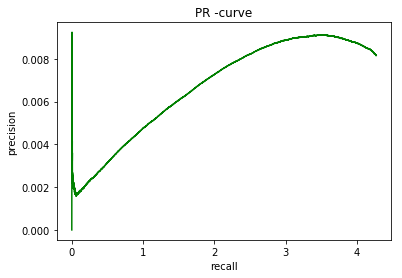

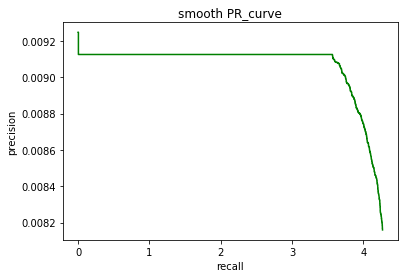

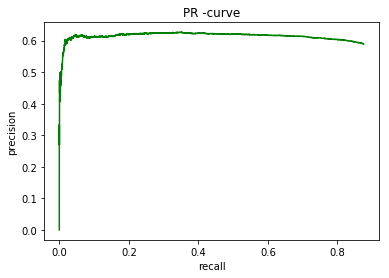

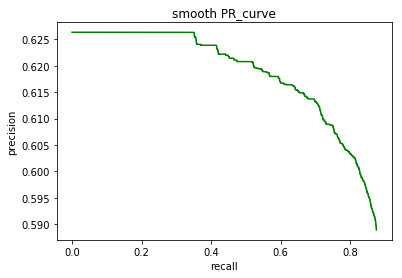

0.24238905697710825
Epoch 31/40
0.20361709938115002
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


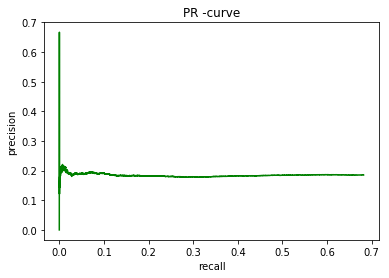

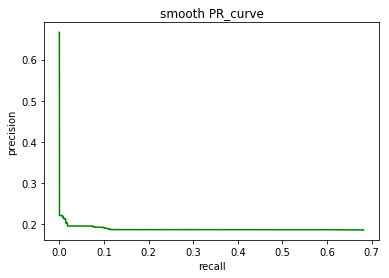

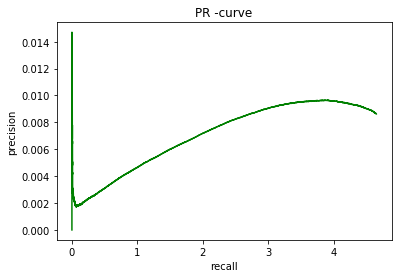

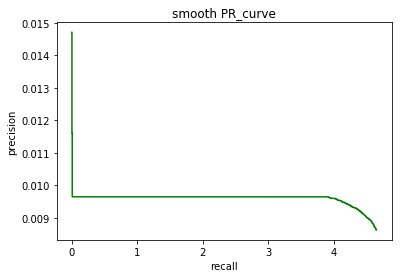

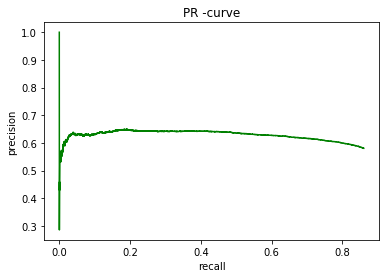

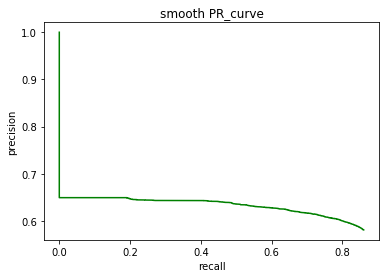

0.23913836470465555
Epoch 32/40
0.19981583322409807
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion
suppresion


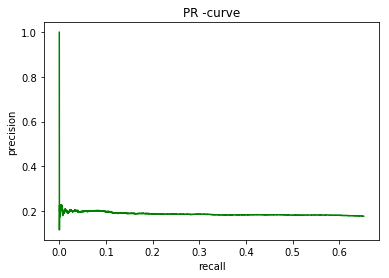

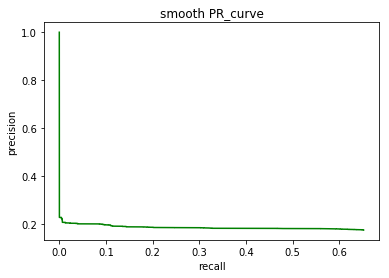

In [0]:
## get mAP training 

## loss function
yolo1 = YOLOish()
yolo1.to(device)
yolo1 = yolo1.double()

optimizer = optim.Adam(yolo1.parameters(), lr=0.001)

# def IOU(x1,y1,x2,y2):
#   box[A] = [ x1,y1]
#   box[B] = [ x2,y2]
#   # determine the (x, y)-coordinates of the intersection rectangle
# 	xA = max(boxA[0], boxB[0])
# 	yA = max(boxA[1], boxB[1])
# 	xB = min(boxA[2], boxB[2])
# 	yB = min(boxA[3], boxB[3])
 
# 	# compute the area of intersection rectangle
# 	interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
 
# 	# compute the area of both the prediction and ground-truth
# 	# rectangles
# 	boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
# 	boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
 
# 	# compute the intersection over union by taking the intersection
# 	# area and dividing it by the sum of prediction + ground-truth
# 	# areas - the interesection area
# 	iou = interArea / float(boxAArea + boxBArea - interArea)
  
#   return iou
def train_call(pr1,re1,tp_fn1,pr_2,re_2,tp_fn2,pr3,re3,tp_fn3,model1,data):
    p1,r1,t1,p2,r2,t2,p3,r3,t3=test(model1,data)
    pr1.append(p1)
    re1.append(r1)
    tp_fn1.append(t1)
    pr2.append(p2)
    re2.append(r2)
    tp_fn2.append(t2)
    pr3.append(p3)
    re3.append(r3)
    tp_fn3.append(t3)
    return pr1,re1,tp_fn1,pr2,re2,tp_fn2,pr3,re3,tp_fn3

def loss_fn(y_pred,y):
  co_ord =5
  no_obj=0.5
  loc1 = torch.pow(y[:,:,:,1]-y_pred[:,:,:,1],2)
  loc2 = torch.pow(y[:,:,:,2]-y_pred[:,:,:,2],2)
  loc_loss1 = co_ord* torch.sum(y[:,:,:,0]*(loc1+loc2))
  l1 = (torch.sqrt(y[:,:,:,3])-torch.sqrt(y_pred[:,:,:,3]))**2
  l2 = (torch.sqrt(y[:,:,:,4]) -torch.sqrt(y_pred[:,:,:,4]))**2
  loc_loss2 = co_ord* torch.sum(y[:,:,:,0]*(l1+l2))
  loc_loss =  loc_loss1+ loc_loss2
  conf1 = torch.pow((y[:,:,:,0]-y_pred[:,:,:,0]),2)
  conf_loss1 = torch.sum(y[:,:,:,0]* conf1)
  conf2 = 1- y[:,:,:,0]
  conf3 = torch.pow(y[:,:,:,0] - y_pred[:,:,:,0],2)
  conf_loss2 = no_obj* torch.sum(conf2 * conf3)
  conf_loss= conf_loss1 +conf_loss2
  c1 = torch.pow((y[:,:,:,5]) -(y_pred[:,:,:,5]),2)
  c2 = torch.pow((y[:,:,:,6]) -(y_pred[:,:,:,6]),2)
  c3 = torch.pow((y[:,:,:,7]) -(y_pred[:,:,:,7]),2)
  cl_loss= torch.sum(y[:,:,:,0]* (c1+c2+c3))
  
  return loc_loss + conf_loss+ cl_loss
                      
def train(model,optimizer):
# Train your network here and initialize losses 
  correct=0
  total_loss = []
  train_acc=[]
  test_losses =[]
  num_epochs = 40
  test_loss=[]
  test_acc=[]
  mp=[]
  for epoch in range(num_epochs):
    print("Epoch %d/%d" % (epoch+1, num_epochs))
    running_loss = 0.0
    pr_total1=[]
    re_total =[]
    pr1=[]
    re1=[]
    tp_fn1 =[]
    pr2=[]
    re2=[]
    tp_fn2 =[]
    pr3=[]
    re3=[]
    tp_fn3 =[]
    model.train()
    for i, data in enumerate(train_loader, 0):
#         print(i)
        inputs, labels = data[0].to(device,dtype= float),data[1].to(device,dtype=float)
        inputs = inputs.transpose(1,3)
        outputs = model(inputs)
#         print(outputs.shape)
        loss = loss_fn(outputs, labels)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        running_loss+=loss.item()
    print(running_loss/(8000))
    total_loss.append(running_loss/(8000))
    
    for i, data in enumerate(train_loader,0):
      for j in range(data[0].shape[0]):
          inputs = (data[0][j,:,:,:],data[1][j,:,:,:])
          pr1,re1,tp_fn1,pr2,re2,tp_fn2,pr3,re3,tp_fn3=train_call(pr1,re1,tp_fn1,pr2,re2,tp_fn2,pr3,re3,tp_fn3,model,inputs)
          
    #cal ap for class1 , class 2 ,class3
    a1 = cal_area(pr1,re1,tp_fn1)
    a2 = cal_area(pr2,re2,tp_fn2)
    a3 = cal_area(pr3,re3,tp_fn3)
    print((a1+a2+a3)/3)
    mp.append((a1+a2+a3)/3)
  torch.save(yolo1,'map_model.pt')
  return total_loss,mp

los,mp= train(yolo1,optimizer)
def plot_loss(l,epochs):
  y = np.arange(1,epochs+1)
  plt.plot(y,l,'black')
  plt.xlabel('epochs')
  plt.ylabel('loss')
  plt.show()
  
# plot_loss(los,20)


  

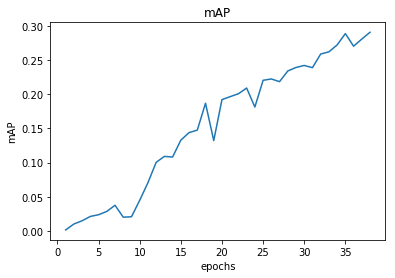

In [0]:
import matplotlib.pyplot as plt
import numpy as np 
epo = np.arange(1,len(mp)+1)
plt.plot(epo,mp)
plt.xlabel('epochs')
plt.ylabel('mAP')
plt.title('mAP')
plt.show()

In [0]:
# ## testing code 
# xpr1=[]
# xre1=[]
# xtp_fn1 =[]
# xpr2=[]
# xre2=[]
# xtp_fn2 =[]
# xpr3=[]
# xre3=[]
# xtp_fn3 =[]
# for i,data in enumerate(train_loader):
# #   print(i)
#   print(data[0].shape,data[1].shape)
#   for j in range(data[0].shape[0]):
#     inputs = (data[0][j,:,:,:],data[1][j,:,:,:])
#     train_call(xpr1,xre1,xtp_fn1,xpr2,xre2,xtp_fn2,xpr3,xre3,xtp_fn3,model2,inputs)